# Description

Credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

The Thera bank recently saw a steep decline in the number of users of their credit card. Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas.

As a Data scientist at Thera bank, I would like to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards. Thus, I need to identify the best possible model that will give the required performance



# Objectives

    1. Explore and visualize the dataset.
    2. Build a classification model to predict if the customer is going to churn or not
    3. Optimize the model using appropriate techniques
    4. Generate a set of insights and recommendations that will help the bank


# Data Dictionary:

CLIENTNUM: Client number. Unique identifier for the customer holding the account

Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing
Customer"

Customer_Age: Age in Years

Gender: Gender of the account holder

Dependent_count: Number of dependents

Education_Level:  Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to a college student), Post-Graduate, Doctorate.

Marital_Status: Marital Status of the account holder

Income_Category: Annual Income Category of the account holder

Card_Category: Type of Card

Months_on_book: Period of relationship with the bank

Total_Relationship_Count: Total no. of products held by the customer

Months_Inactive_12_mon: No. of months inactive in the last 12 months

Contacts_Count_12_mon: No. of Contacts between the customer and bank in the last 12 months

Credit_Limit: Credit Limit on the Credit Card

Total_Revolving_Bal: The balance that carries over from one month to the next is the revolving balance

Avg_Open_To_Buy: Open to Buy refers to the amount left on the credit card to use (Average of last 12 months)

Total_Trans_Amt: Total Transaction Amount (Last 12 months)

Total_Trans_Ct: Total Transaction Count (Last 12 months)

Total_Ct_Chng_Q4_Q1: Ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter

Total_Amt_Chng_Q4_Q1: Ratio of the total transaction amount in 4th quarter and the total transaction amount in 1st quarter

Avg_Utilization_Ratio: Represents how much of the available credit the customer spent


In [1]:
# To help with reading and manipulating data
import pandas as pd
import numpy as np

# To help with data visualization
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# To be used for missing value imputation
from sklearn.impute import SimpleImputer

# To help with model building
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier

# To get different metric scores, and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    plot_confusion_matrix,
)

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder


# To be used for tuning the model
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# To be used for creating pipelines and personalizing them
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings

warnings.filterwarnings("ignore")

# This will help in making the Python code more structured automatically (good coding practice)
%load_ext nb_black

<IPython.core.display.Javascript object>

In [2]:
import matplotlib

font = {"family": "normal", "weight": "bold", "size": 22}
matplotlib.rc("font", **font)

<IPython.core.display.Javascript object>

# Read Dataset

In [3]:
bc = pd.read_csv("BankChurners.csv")

<IPython.core.display.Javascript object>

In [4]:
data = bc.copy()  # Copy data for version control

<IPython.core.display.Javascript object>

In [5]:
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


<IPython.core.display.Javascript object>

In [6]:
data.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

<IPython.core.display.Javascript object>

In [7]:
for col in data.columns:
    print(data[col].value_counts())
    print("-" * 100)

709920258    1
717171408    1
709372608    1
796336833    1
721433283    1
            ..
720250158    1
709831983    1
720917808    1
719207733    1
708085458    1
Name: CLIENTNUM, Length: 10127, dtype: int64
----------------------------------------------------------------------------------------------------
Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64
----------------------------------------------------------------------------------------------------
44    500
49    495
46    490
45    486
47    479
43    473
48    472
50    452
42    426
51    398
53    387
41    379
52    376
40    361
39    333
54    307
38    303
55    279
56    262
37    260
57    223
36    221
35    184
58    157
59    157
34    146
33    127
60    127
32    106
65    101
61     93
62     93
31     91
26     78
30     70
63     65
29     56
64     43
27     32
28     29
67      4
68      2
66      2
70      1
73      1
Name: Customer_Age, dtype: int64
------------------

<IPython.core.display.Javascript object>

The only continuous variables are: Customer_Age,Months_on_book, Credit_Limit, Total_Revolving_Bal,Avg_Open_To_Buy, Total_Amt_Chng_Q4_Q1, Total_Trans_Amt, Total_Trans_Ct, Total_Ct_Chng_Q4_Q1, Avg_Utilization_Ratio

In [8]:
data.duplicated().sum()  # check for duplicated observations

0

<IPython.core.display.Javascript object>

In [9]:
data.isna().sum()  # check for null or missing values

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

<IPython.core.display.Javascript object>

Education_Level and Marital_Status have missing values

In [10]:
data.shape  # determine shape of dataset

(10127, 21)

<IPython.core.display.Javascript object>

In [11]:
# let's check the data types of the columns in the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

<IPython.core.display.Javascript object>

In [12]:
data.drop(
    columns=["CLIENTNUM"], inplace=True, axis=1
)  # drop CLIENTNUM, customers' unique ID and not relevant for analysis

<IPython.core.display.Javascript object>

In [13]:
# Let's take these variables as categorical data

cat = [
    "Attrition_Flag",
    "Gender",
    "Dependent_count",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
]
for i in cat:
    data[i] = data[i].astype("category")

<IPython.core.display.Javascript object>

In [14]:
# Continuous variables
Cont = [
    "Customer_Age",
    "Months_on_book",
    "Credit_Limit",
    "Total_Revolving_Bal",
    "Avg_Open_To_Buy",
    "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt",
    "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio",
]

<IPython.core.display.Javascript object>

In [15]:
data.describe(include="all").T  # General distribution of the data

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Attrition_Flag,10127,2,Existing Customer,8500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,10127.000,NaN,NaN,NaN,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Gender,10127,2,F,5358,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,10127.000,6.000,3.000,2732.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Education_Level,8608,6,Graduate,3128,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,9378,3,Married,4687,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,10127,6,Less than $40K,3561,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,10127,4,Blue,9436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,10127.000,NaN,NaN,NaN,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,6.000,3.000,2305.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<IPython.core.display.Javascript object>

More existing customers than attrited customers.
More female, graduate, married, blue card, and more income earners less than 40K dollars in the dataset.

# Let's carry out some univariate data analysis

In [16]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

<IPython.core.display.Javascript object>

In [17]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

<IPython.core.display.Javascript object>

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


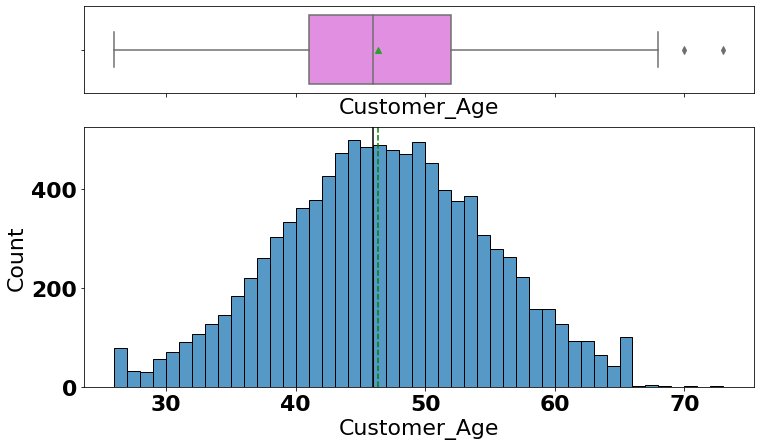

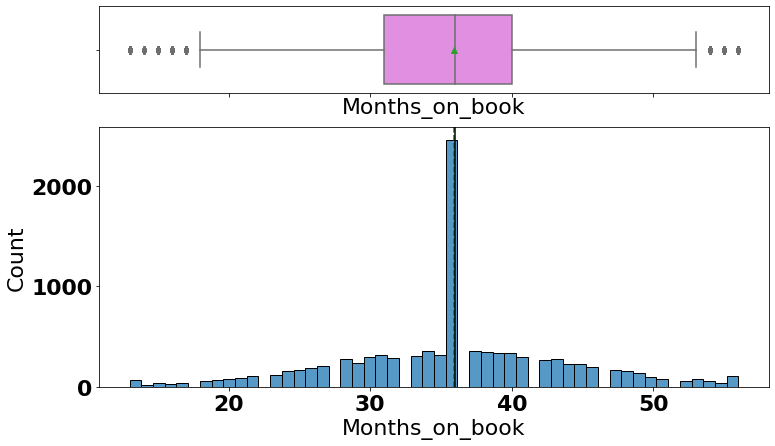

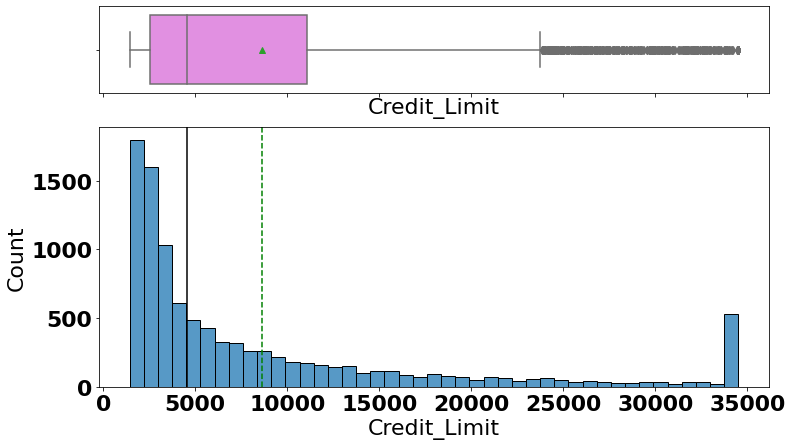

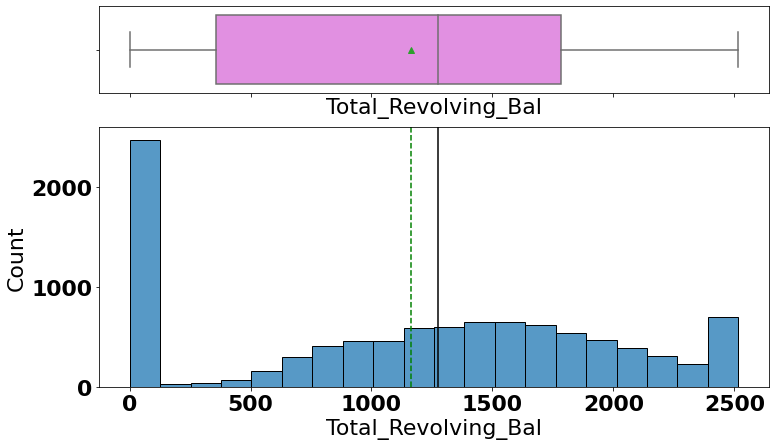

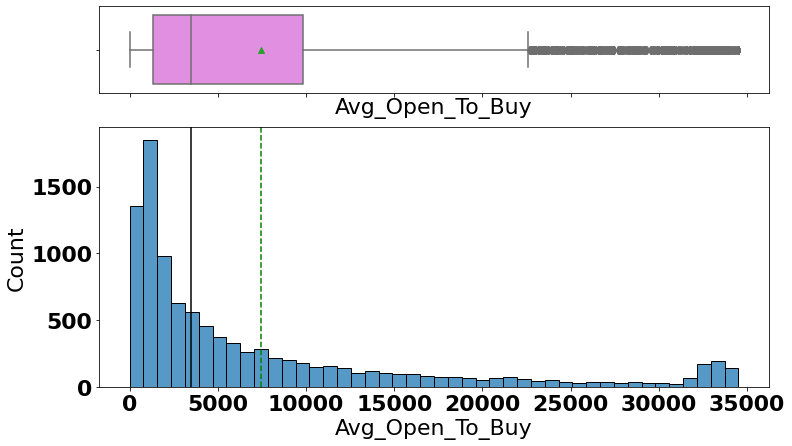

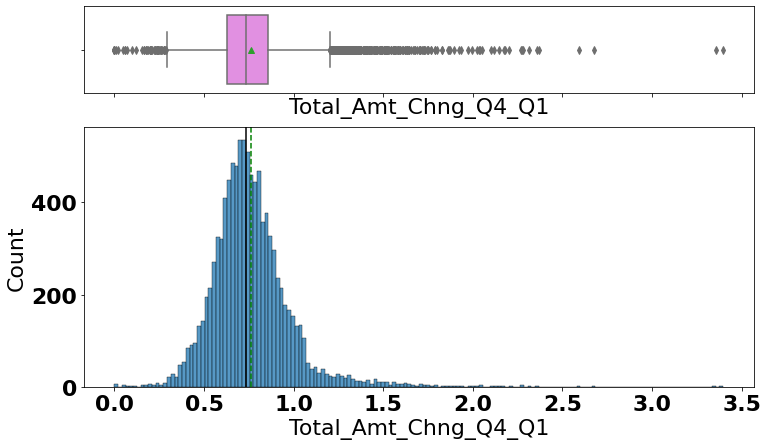

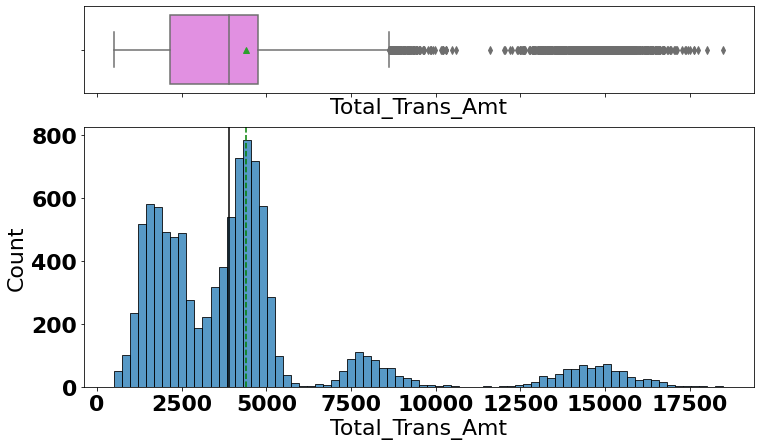

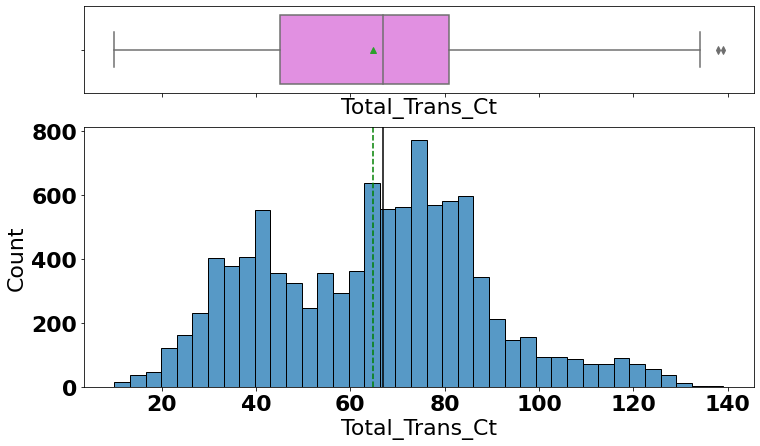

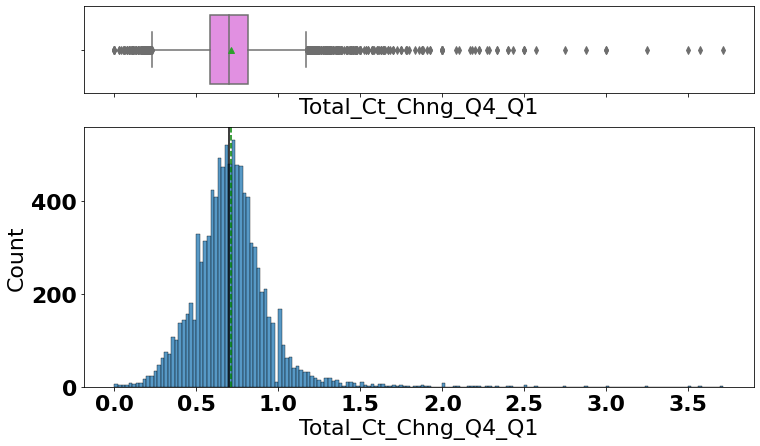

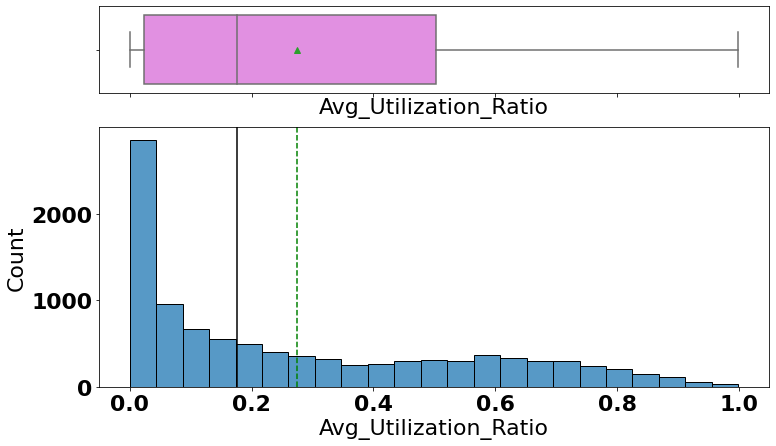

<IPython.core.display.Javascript object>

In [18]:
Cont = [
    "Customer_Age",
    "Months_on_book",
    "Credit_Limit",
    "Total_Revolving_Bal",
    "Avg_Open_To_Buy",
    "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt",
    "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio",
]
for i in Cont:
    histogram_boxplot(data, i)

- Customer_Age and Months_on_book have close mean and median and appear normally distributed.
- Credit_Limit is right-skewed and outliers are observed above (23,500 dollars)
- Total_Revolving_Bal is left-skewed but no outlier identified
- Avg_Open_To_Buy is right-skewed and outliers are observed above (22,500 dollars)
- Total_Amt_Chng_Q4_Q1 appears partially right-skewed, however outliers are observed below 0.3 and above 1.2
- Total_Trans_Amt is right-skewed and outliers are observed above (8500 dollars)
- Total_Trans_Ct is left-skewed, however  a few outliers are observed above 134
- Total_Ct_Chng_Q4_Q1 appears normally distributed, however outliers are observed below 0.2 and above 1.2
- Avg_Utilization_Ratio is right-skewed, however no outliers identified.

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


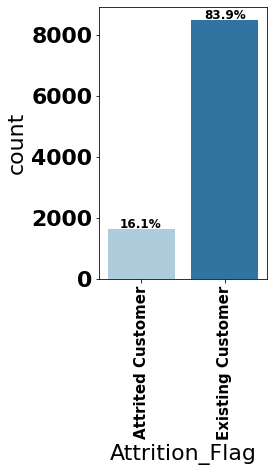

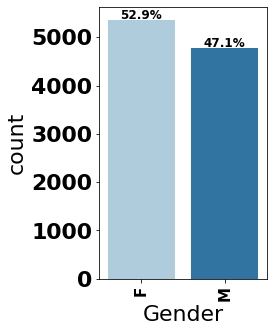

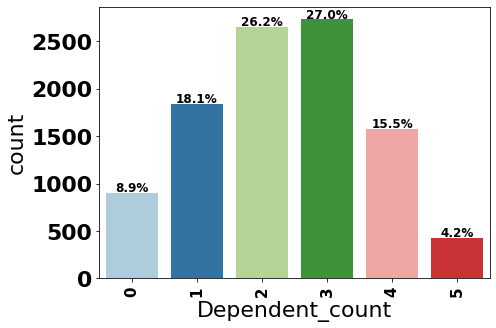

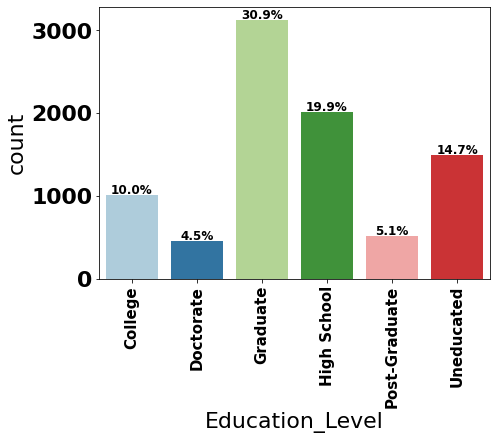

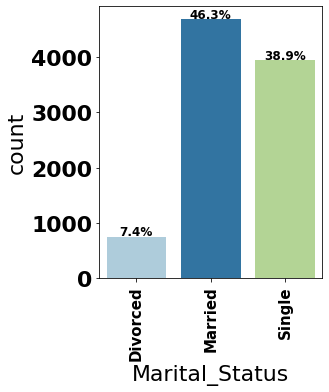

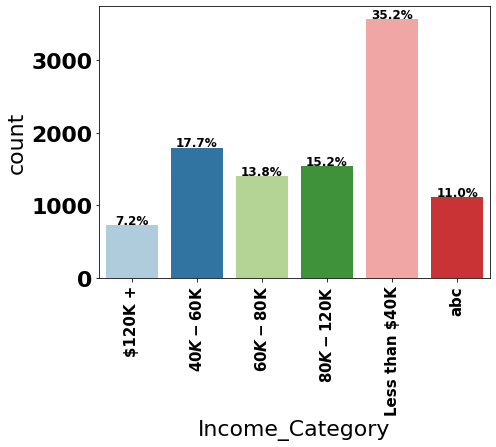

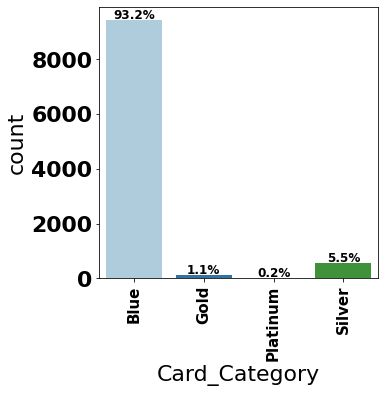

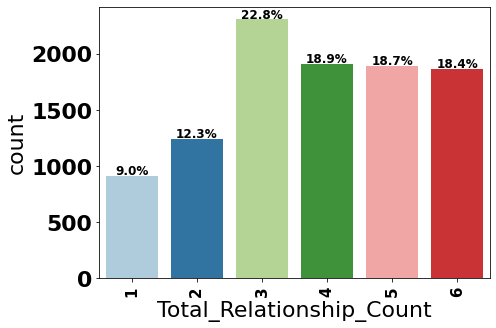

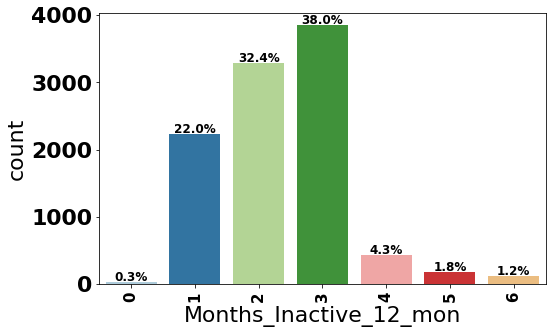

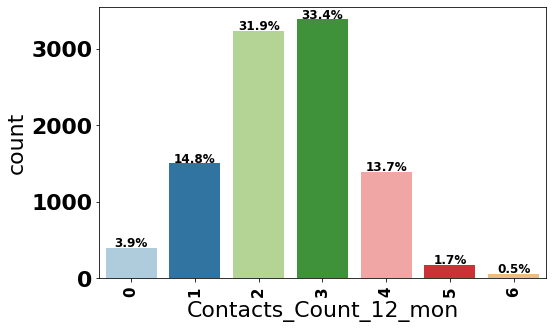

<IPython.core.display.Javascript object>

In [19]:
# Let's take these variables as categorical data

cat = [
    "Attrition_Flag",
    "Gender",
    "Dependent_count",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
]
for i in cat:
    labeled_barplot(data, i, perc=True)

- Majority (83.9%) of the customers are existing customers
- Majority (52.9%) of the customers are female
- Customers with three dependants are more (27.0%) and least five dependants (4.2%) in the dataset
- Most of the customers (30.9%) hold a graduate degree as highest level of qualification and the least for doctorate (4.5%)
- Most of the customers are married (46.3%), followed by single customers (38.9%) and least number of divorced customers 
- Most of the customers are within income level less than 40K dollars (35.2%) and least income category (7.2%) 120K dollars.
- Majority of the customers (93.2%) are in the blue card category and the least (0.2%) in the platinum category
- Most of the customers (22.8%) have three (3) total relationship count (number of products held) and majority of the customers have held at least 3 products (about 79%)
- Most of the customers are 3 months inactive in the last 12 months. However, majority of the customers have been inactive less than 4 months in the last 12 months (92.7%).
- Majority of the customers (97.7%) have had less than 5 months of Contacts with the bank in the last 12 months. But most of them (33.4%) had only 3 months of contact with the bank in the last 12 months.


# Bivariate Analysis

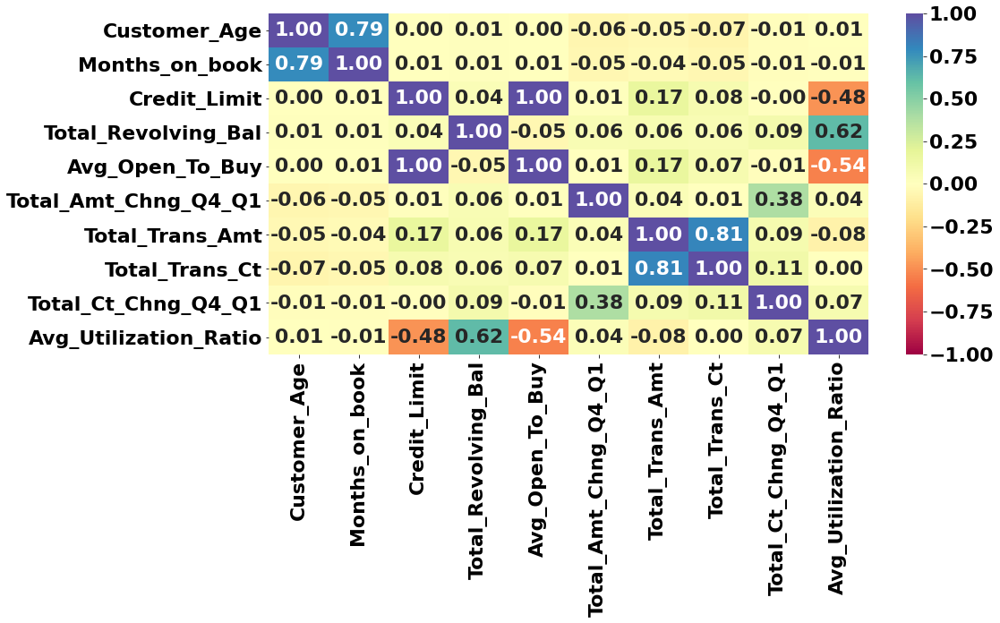

<IPython.core.display.Javascript object>

In [20]:
plt.figure(figsize=(15, 7))
sns.heatmap(data.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

- There is a strong positive correlation (0.79) between Customer_Age and Months_on_book.
- There is a perfect positive correlation (1.0) between Credit_Limit and Avg_Open_To_Buy. One of the columns could be dropped.
- There is a strong positive correlation (0.81) between Tota_Trans_Ct and Total_Trans_Amt. The more transactions the more amount spent.
- There is a strong positive correlation (0.62) between Total_Revolving_Bal and Avg_Utilization_Ratio.
- There is a negative correlation (-0.54) between Avg_Utilization_Ratio and Avg_Open_To_Buy. An increase in one of the variables results in a decrease in the other.

In [21]:
data1 = data.copy()  # For version control

<IPython.core.display.Javascript object>

In [22]:
# Label encode Attrition_Flag
data1["Attrition_Flag"] = data1["Attrition_Flag"].replace(
    {"Existing Customer": 0, "Attrited Customer": 1}
)

<IPython.core.display.Javascript object>

# Let's see if any of the variables have strong or negative correlation with Attrition_Flag

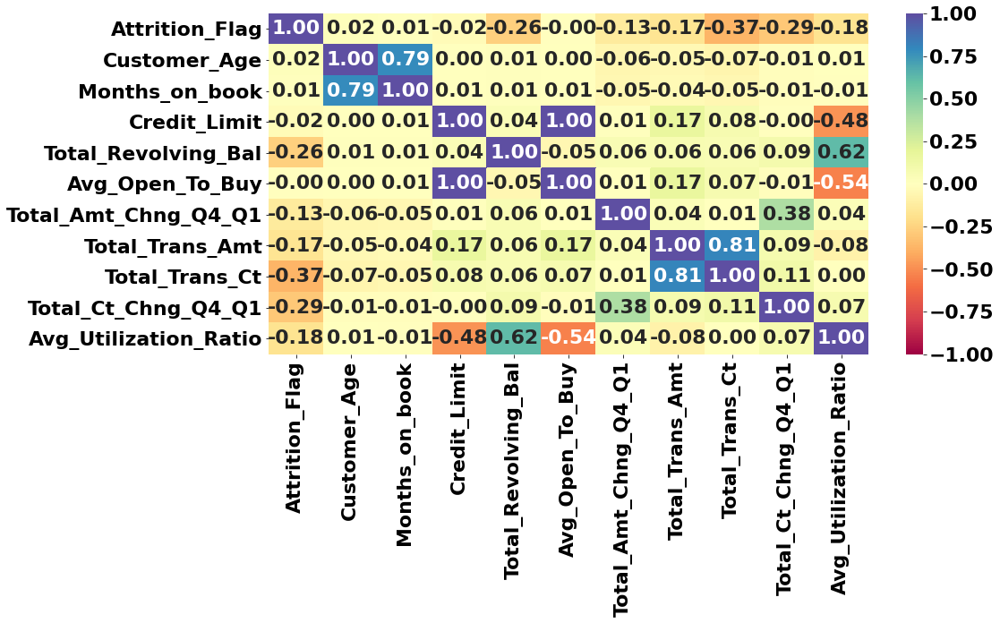

<IPython.core.display.Javascript object>

In [23]:
plt.figure(figsize=(15, 7))
sns.heatmap(data1.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

None of the variables have a strong relationship individually with the Attrition Flag.

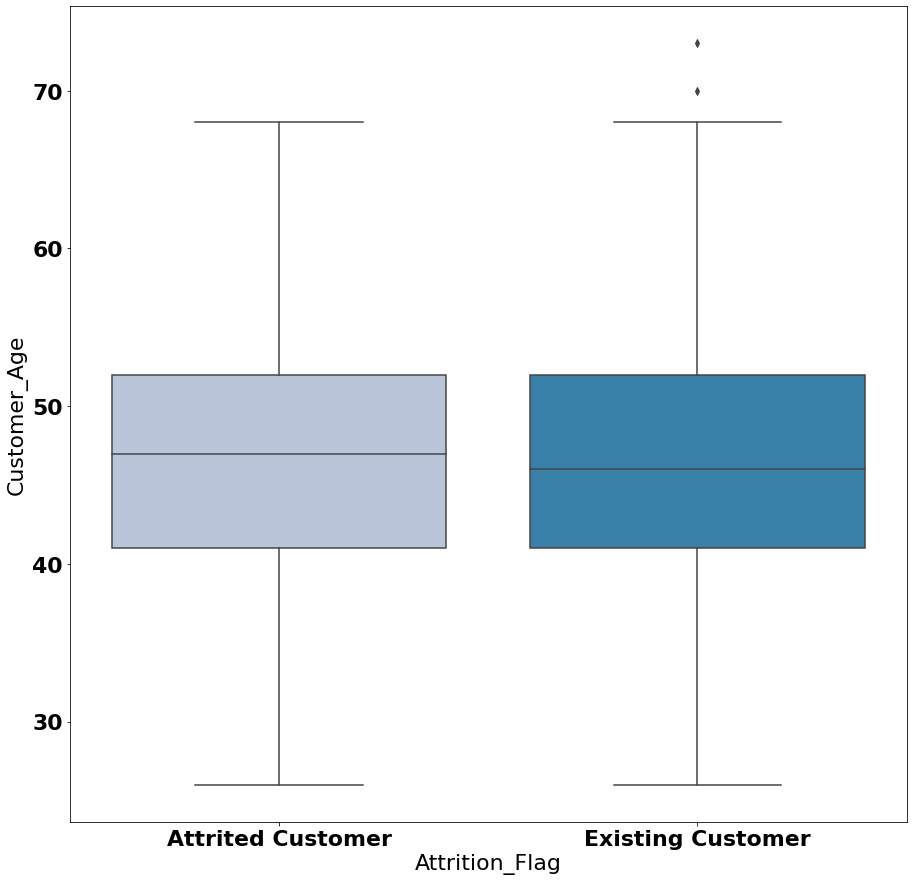

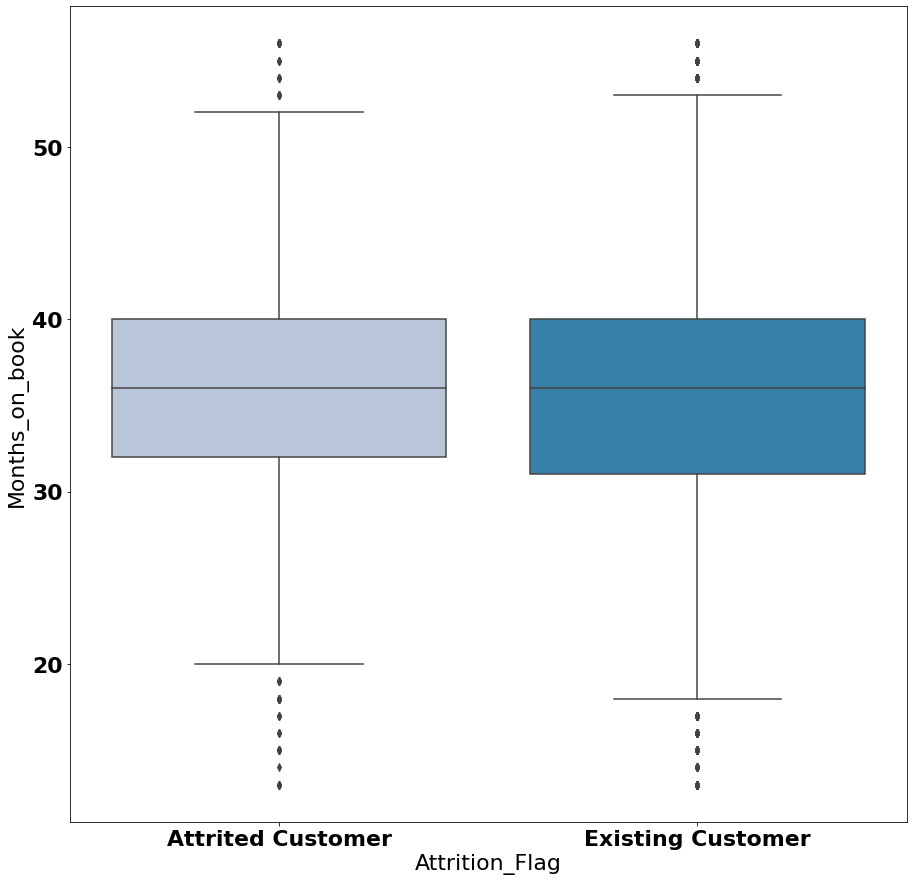

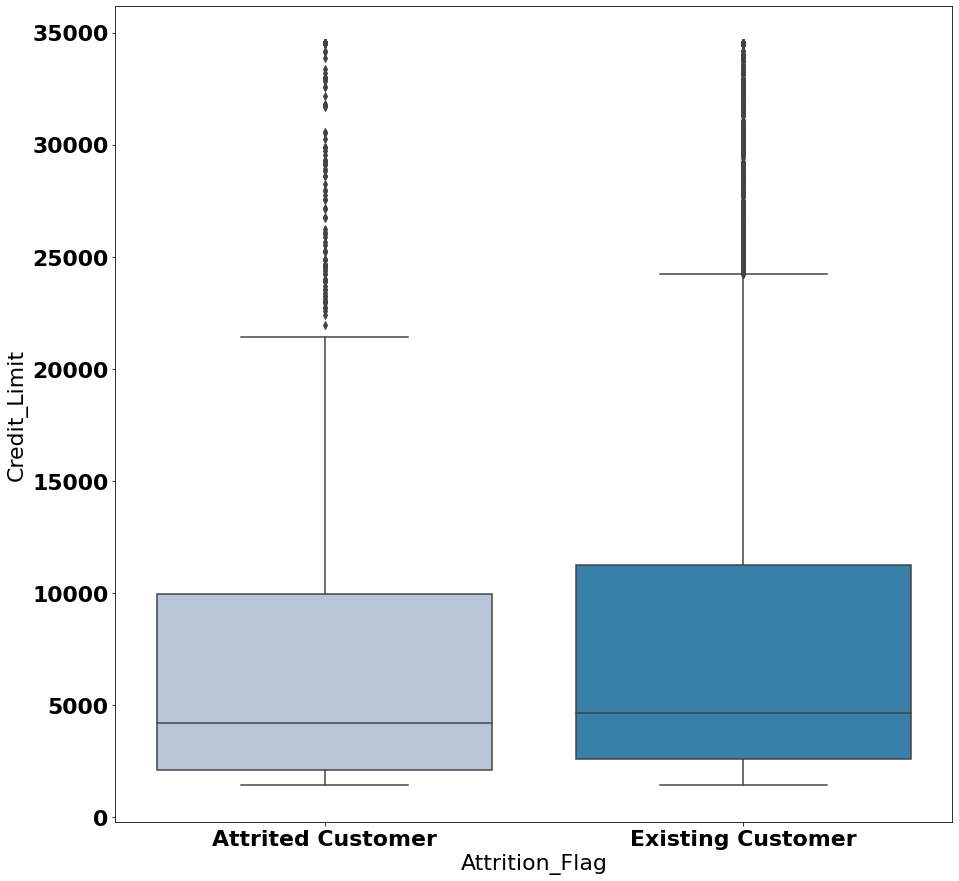

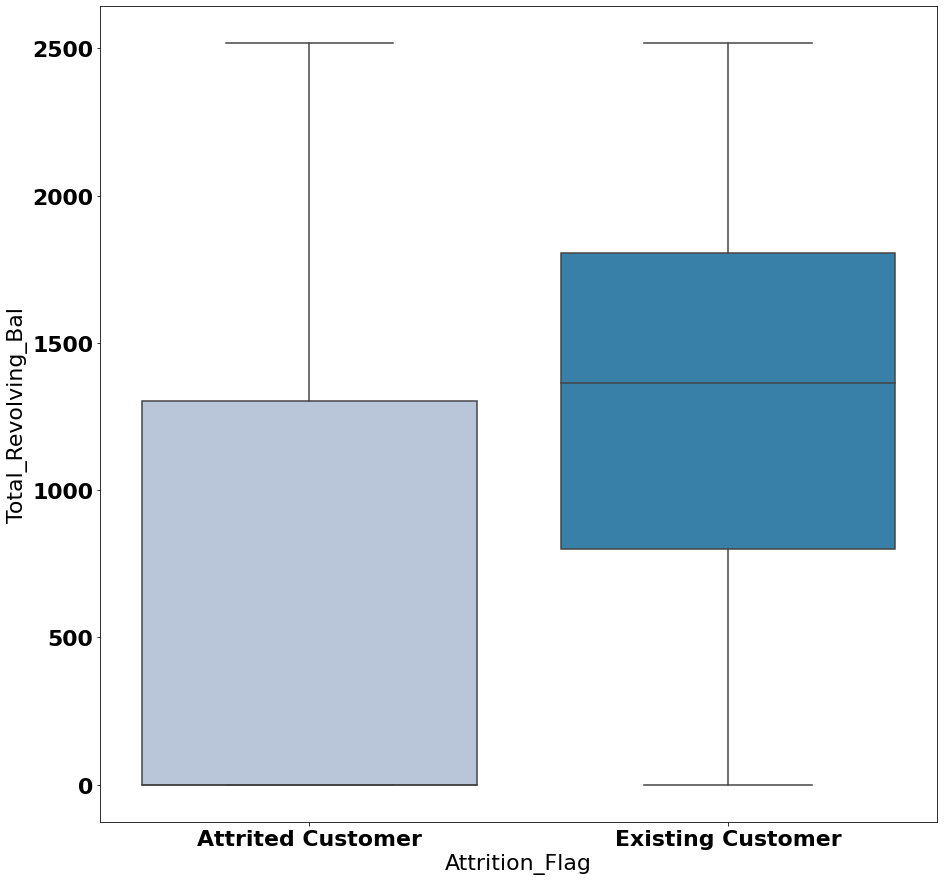

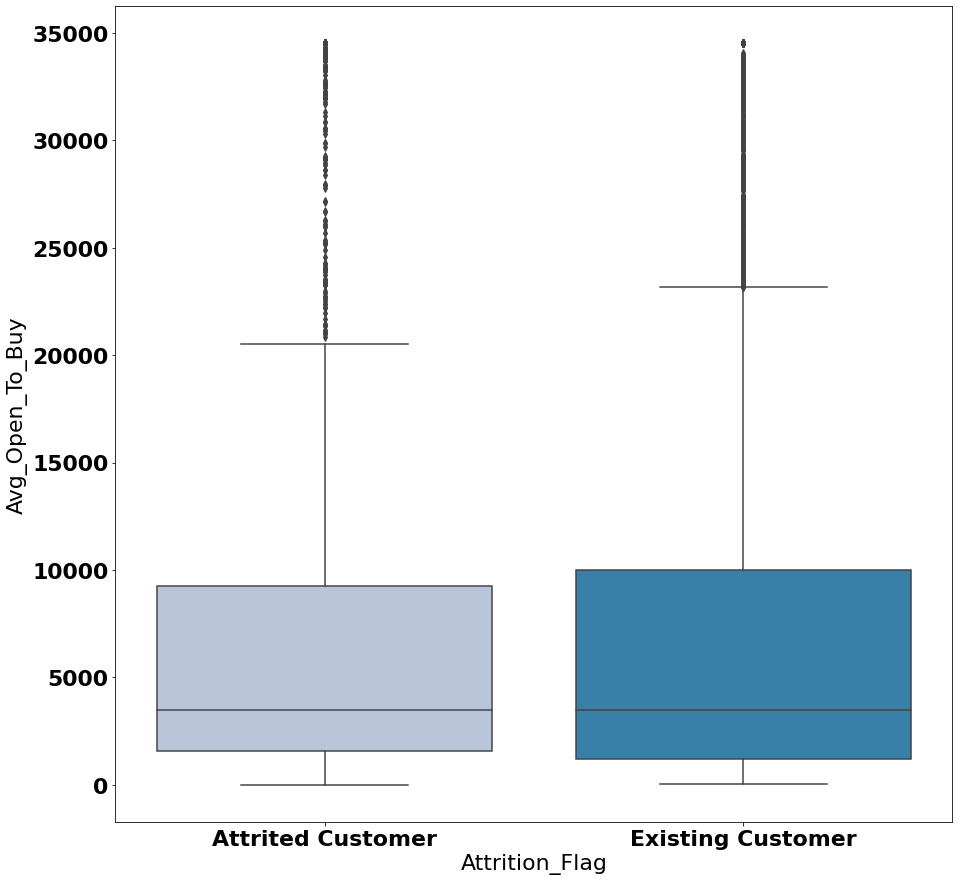

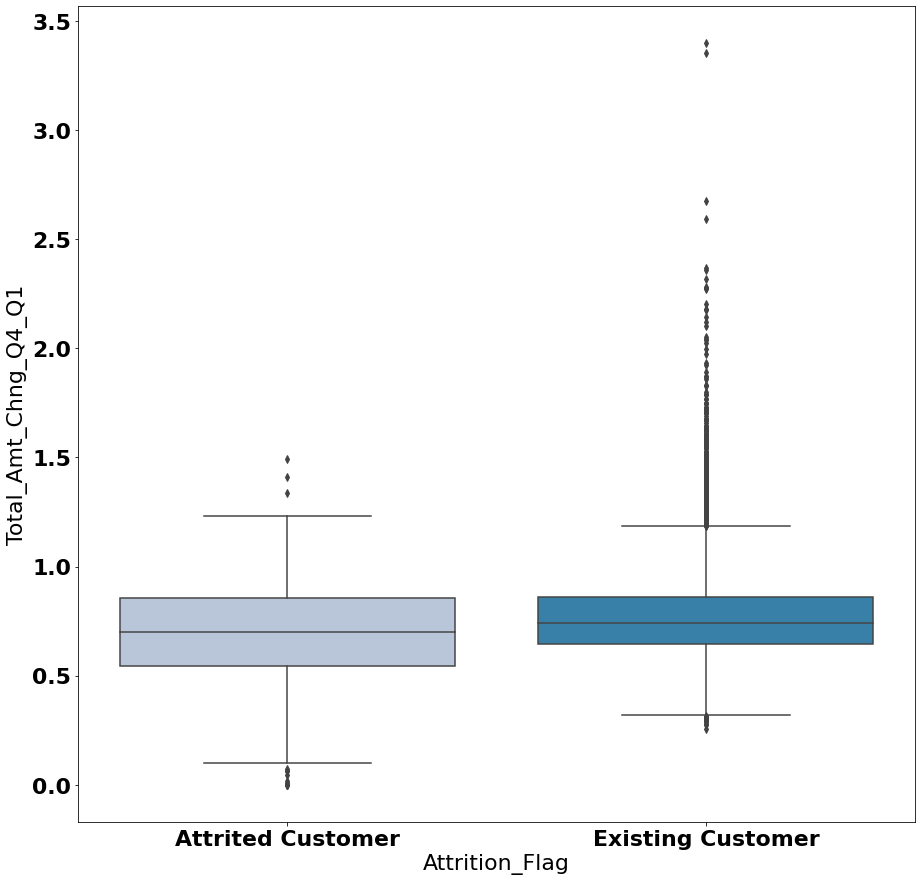

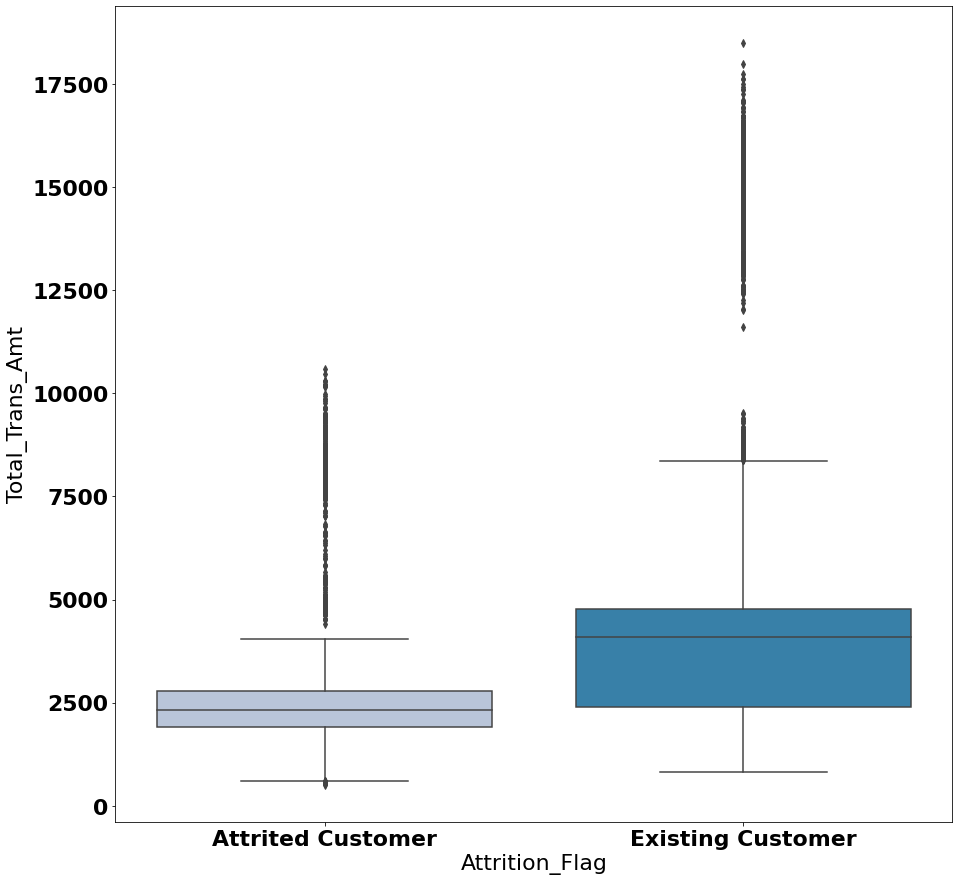

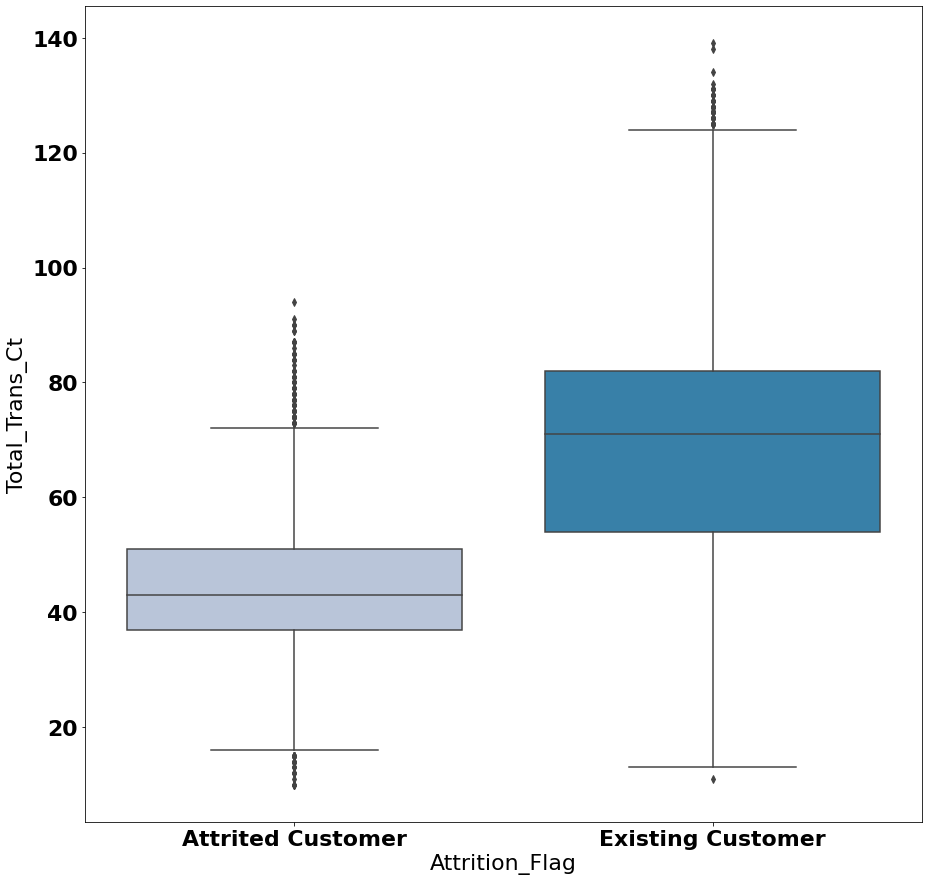

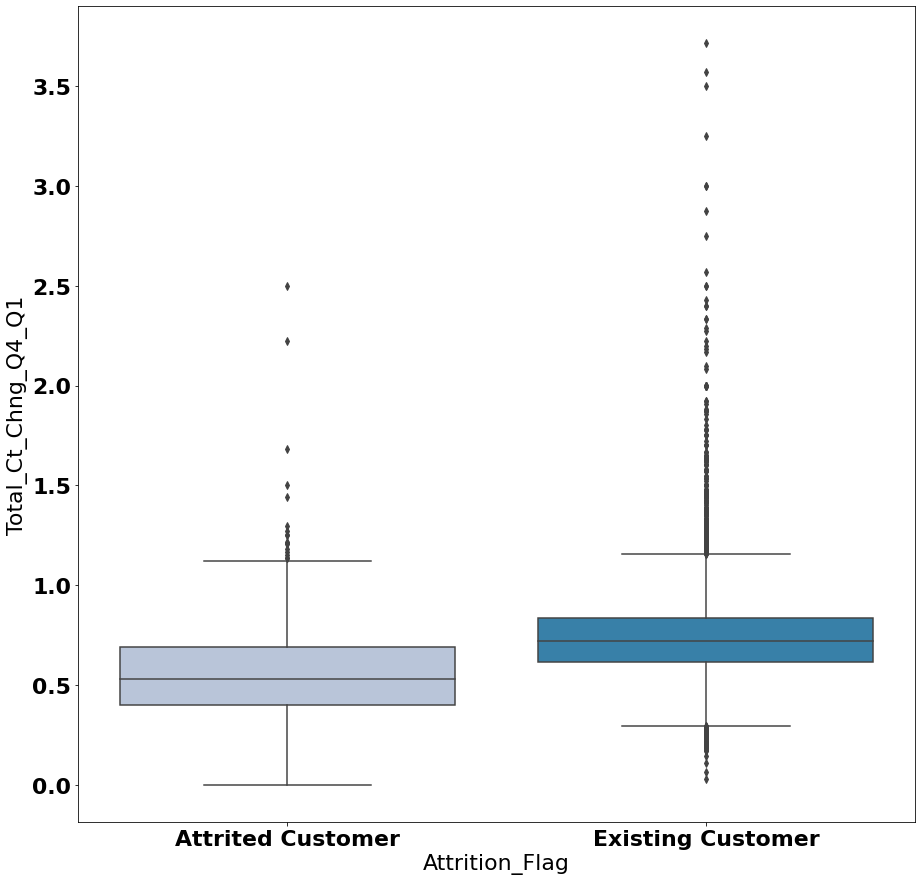

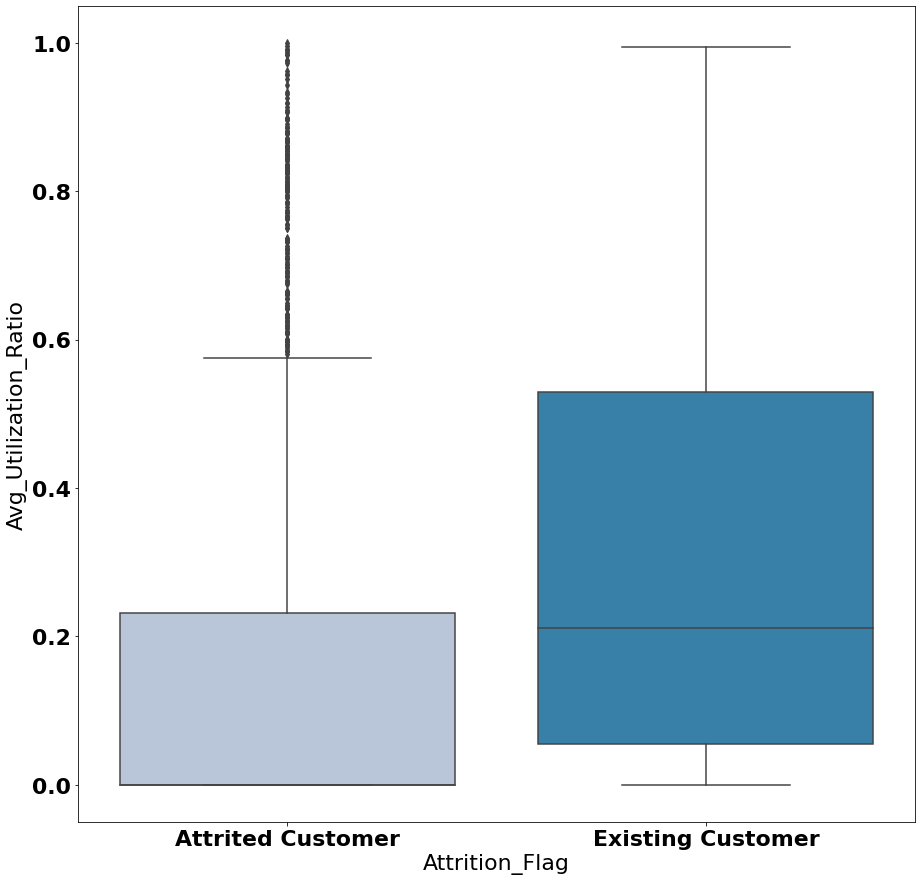

<IPython.core.display.Javascript object>

In [24]:
## function to plot boxplots w.rt ProdTaken

Cont = [
    "Customer_Age",
    "Months_on_book",
    "Credit_Limit",
    "Total_Revolving_Bal",
    "Avg_Open_To_Buy",
    "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt",
    "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio",
]
for i in Cont:
    plt.figure(figsize=(15, 15))
    sns.boxplot(data["Attrition_Flag"], data[i], palette="PuBu")
    plt.show()

- Customer age did not outrightly tell whether a customer remained or attrited.
- Average Months_on_book did not impact customer attrition. However, customers who remained are within wider range from 16 months.
- Customers with higher credit limit remained with the bank, while customers with lower credit limit attritted.
- Customers with higher Total_Revolving_Bal remained with the bank, while customers with lower Total_Revolving_Bal attritted.
- Customers with higher Avg_Open_To_Buy based on the third-quartile remained with the bank. But, on the average, Avg_Open_To_Buy did not impact customer attrition.
- On the average, customers with higher Total_Amt_Chng_Q4_Q1 remained with the bank, while customers with lower Total_Amt_Chng_Q4_Q1 attritted.
- Customers with higher Total_Trans_Amt remained with the bank, while customers with lower Total_Trans_Amt attritted.
- Customers with higher Total_Trans_Ct remained with the bank, while customers with lower Total_Trans_Ct attritted.
- Customers with higher Total_Ct_Chng_Q4_Q1 remained with the bank, while customers with lower Total_Ct_Chng_Q4_Q1 attritted.
- Customers with higher Avg_Utilization_Ratio remained with the bank, while customers with lower Avg_Utilization_Ratio attritted.


In [25]:
# Mean of numerical variables grouped by attrition
data.groupby(["Attrition_Flag"])[Cont].mean()

,Customer_Age,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Attrition_Flag,,,,,,,,,,
Attrited Customer,46.659,36.178,8136.039,672.823,7463.216,0.694,3095.026,44.934,0.554,0.162
Existing Customer,46.262,35.881,8726.878,1256.604,7470.273,0.773,4654.656,68.673,0.742,0.296


<IPython.core.display.Javascript object>

The table supports the observations from the boxplots above.

Attrition_Flag  Attrited Customer  Existing Customer       All
Gender                                                        
F                         930.000           4428.000  5358.000
M                         697.000           4072.000  4769.000
All                      1627.000           8500.000 10127.000
F                           0.174              0.826       NaN
M                           0.146              0.854       NaN
All                         0.161              0.839       NaN
----------------------------------------------------------------------------------------------------
Attrition_Flag   Attrited Customer  Existing Customer       All
Dependent_count                                                
0                          135.000            769.000   904.000
1                          269.000           1569.000  1838.000
2                          417.000           2238.000  2655.000
3                          482.000           2250.000  2732.000
4          

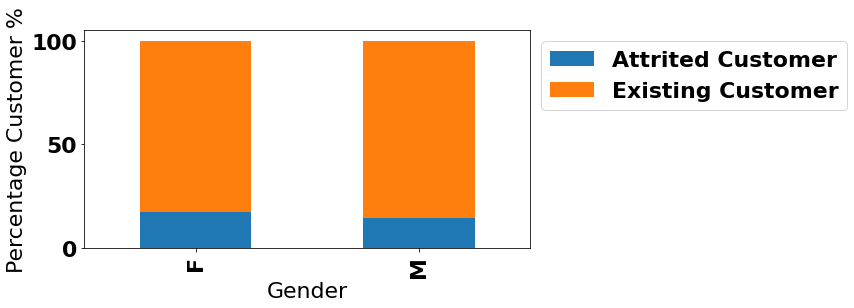

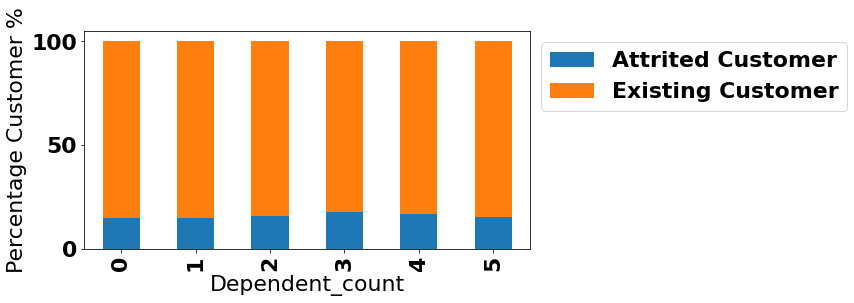

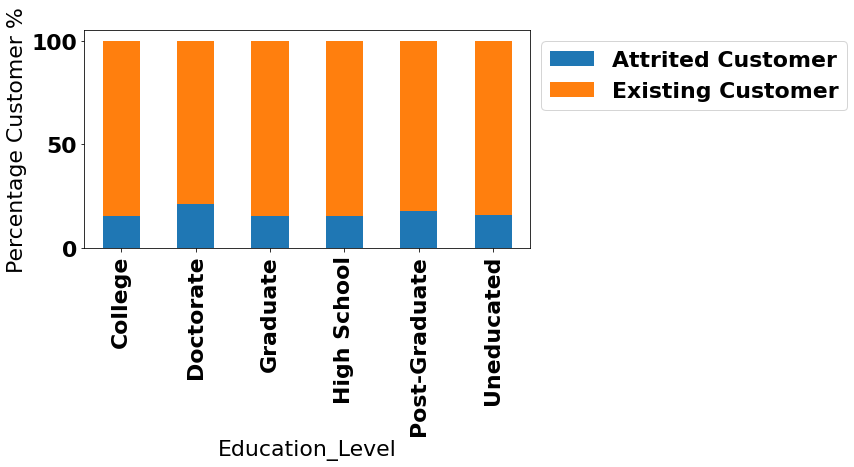

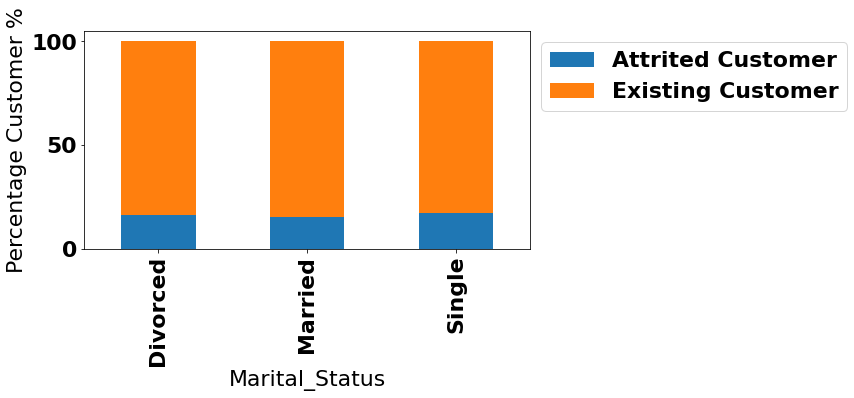

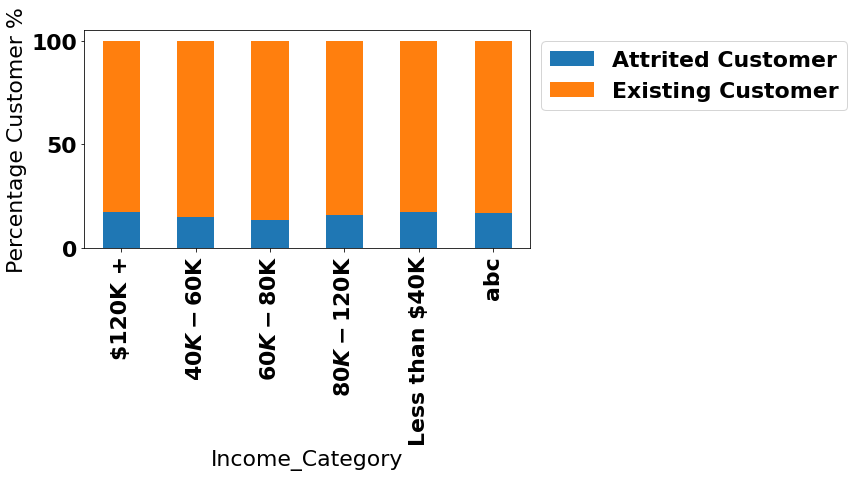

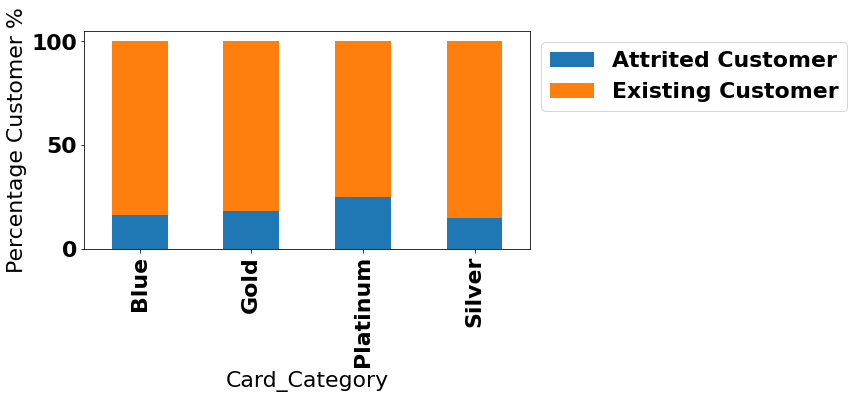

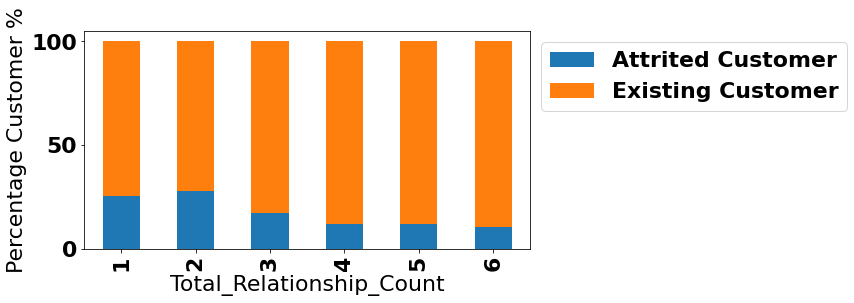

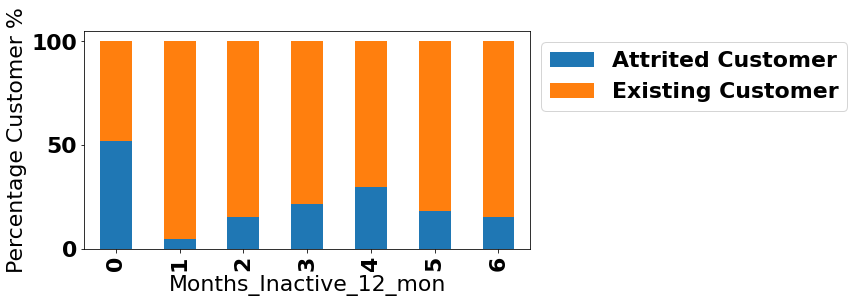

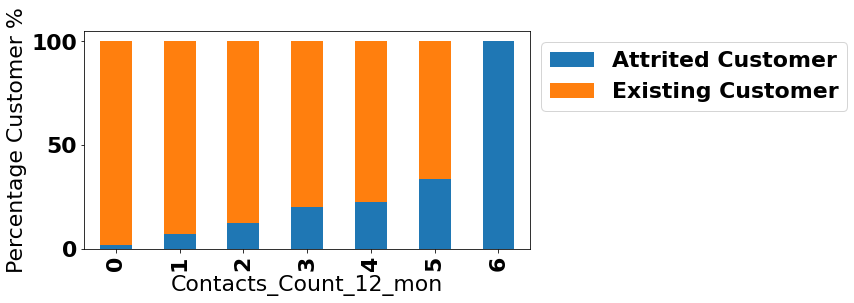

<IPython.core.display.Javascript object>

In [26]:
for i in cat:
    if i != "Attrition_Flag":
        count = data[i].nunique()
        sorter = data["Attrition_Flag"].value_counts().index[-1]
        tab1 = pd.crosstab(
            data[i], data["Attrition_Flag"], normalize="index", margins=True
        )
        tab2 = pd.crosstab(data[i], data["Attrition_Flag"], margins=True)
        print(pd.concat([tab2, tab1]))
        print("-" * 100)
        # print(tab1)

        (pd.crosstab(data[i], data["Attrition_Flag"], normalize="index") * 100).plot(
            kind="bar", figsize=(8, 4), stacked=True
        )
        plt.ylabel("Percentage Customer %")
        plt.legend(
            loc="lower left", frameon=False,
        )
        plt.legend(loc="upper left", bbox_to_anchor=(1, 1))

- More female attrited compared to male.
- The most attrited customers are those with 3 dependants and the least had 1 dependant.
- The most attrited customers have doctorate degree, while the least attrited have college or high school qualifications.
- The most attrited customers are single, while the least attrited are married.
- The most attrited customers earn annual incomes over 120K dollars, followed by those than earn less than 40K dollars; while the least attrited earn between 60K-80K dollars annually. The bank appears inefficient for low and very high income earners.
- The most attrited customers are in Platinum card category, followed by Gold card category; while the least attrited are in the Silver card category.
- The most attrited customers have 2 total relationship count, followed by 1; while the least attrited have 6 relationship count. So, customers who have held 6 products with the bank remain with the bank.
- The most attited customers have never been inactive (0 month) within the last 12 months, however they are negligible in the dataset compared to other customers. More reasonably, the more attrited customers have been inactive for 3 to 4 months; while the least attrited have been inactive for 1 month within the last 12 months. 
- The most attrited customers had contact with the bank 6 times within the last 12 months, followed by 5 in that order up to 0. It appears that the more contact customers have with the bank the more they are attrited.

Income_Category    $120K +  $40K - $60K  $60K - $80K  $80K - $120K  \
Attrition_Flag                                                       
Attrited Customer  126.000      271.000      189.000       242.000   
Existing Customer  601.000     1519.000     1213.000      1293.000   
All                727.000     1790.000     1402.000      1535.000   
Attrited Customer    0.077        0.167        0.116         0.149   
Existing Customer    0.071        0.179        0.143         0.152   
All                  0.072        0.177        0.138         0.152   

Income_Category    Less than $40K      abc       All  
Attrition_Flag                                        
Attrited Customer         612.000  187.000  1627.000  
Existing Customer        2949.000  925.000  8500.000  
All                      3561.000 1112.000 10127.000  
Attrited Customer           0.376    0.115       NaN  
Existing Customer           0.347    0.109       NaN  
All                         0.352    0.110       NaN  

Income_Category           $120K +  $40K - $60K  $60K - $80K  $80K - $120K  \
Total_Relationship_Count                                                    
1                          64.000      159.000      124.000       147.000   
2                         106.000      236.000      164.000       195.000   
3                         157.000      412.000      312.000       340.000   
4                         137.000      322.000      279.000       282.000   
5                         126.000      349.000      267.000       252.000   
6                         137.000      312.000      256.000       319.000   
All                       727.000     1790.000     1402.000      1535.000   
1                           0.070        0.175        0.136         0.162   
2                           0.085        0.190        0.132         0.157   
3                           0.068        0.179        0.135         0.148   
4                           0.072        0.168        0.146         0.147   

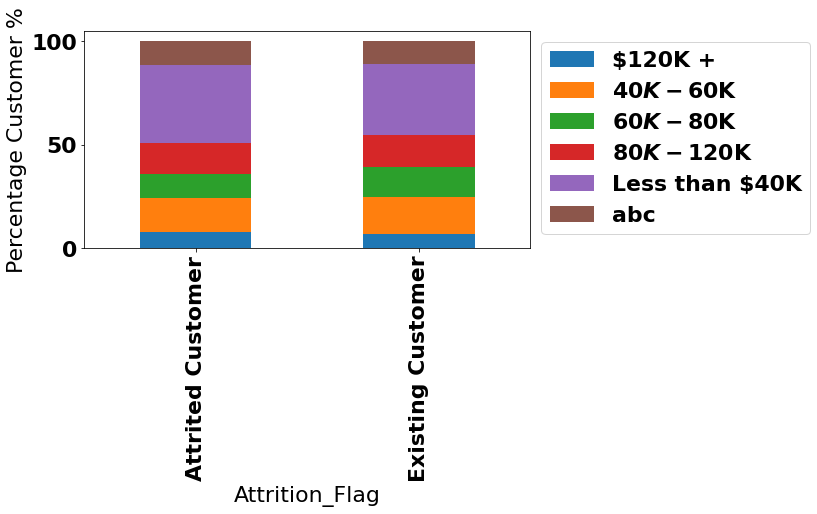

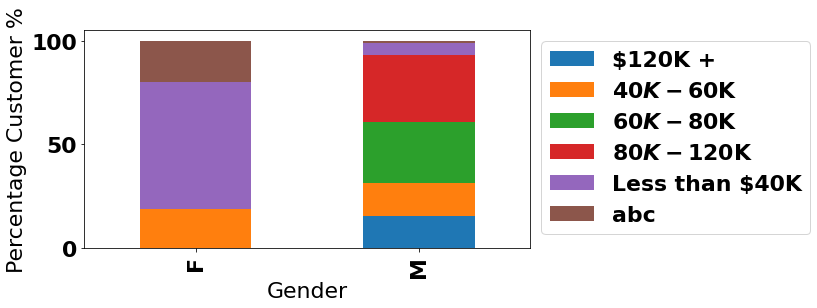

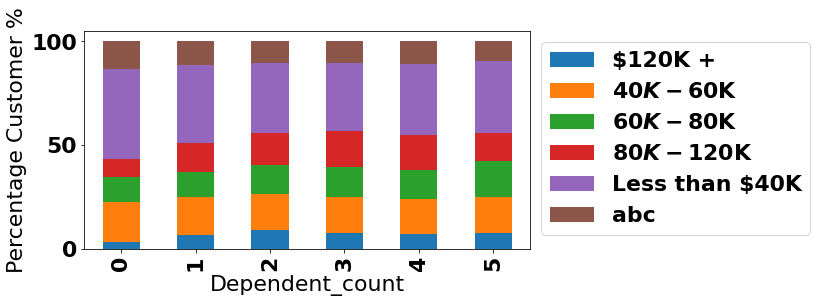

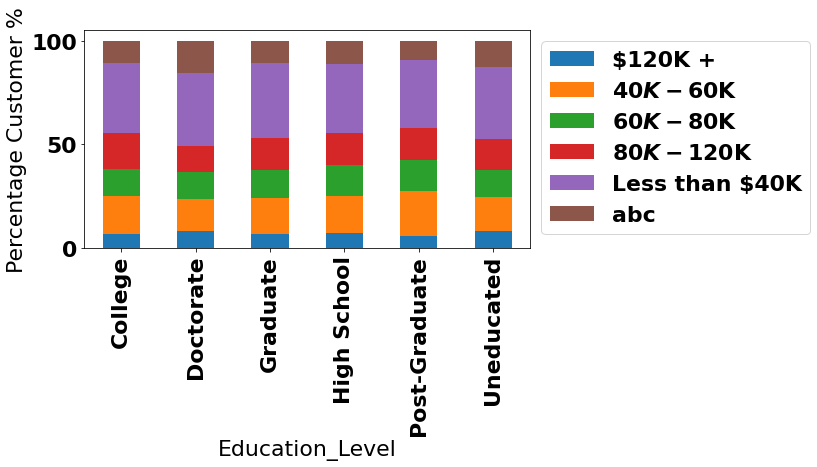

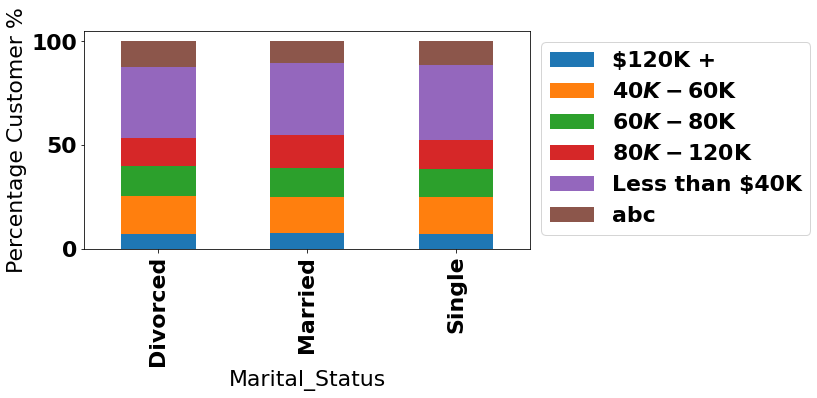

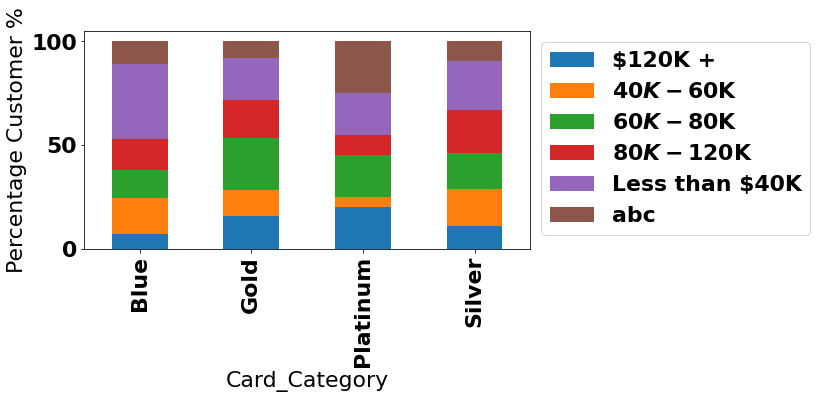

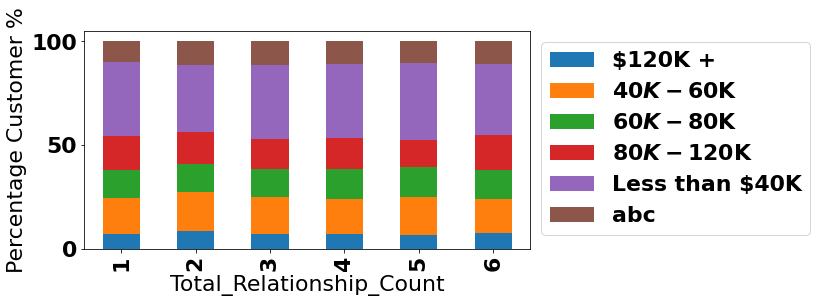

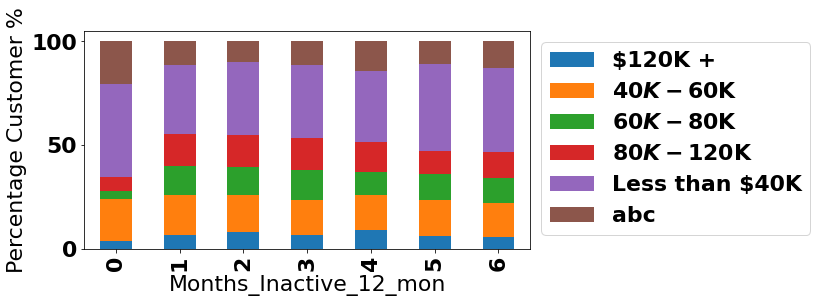

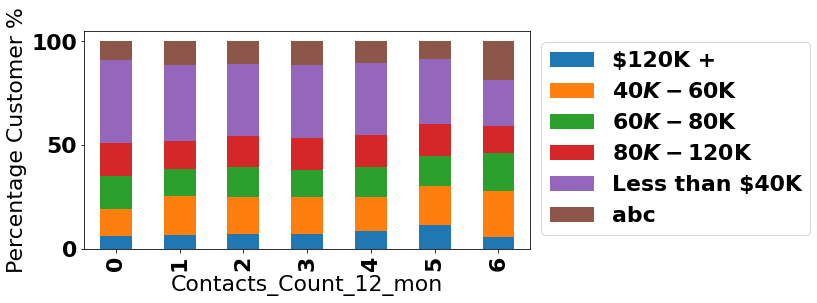

<IPython.core.display.Javascript object>

In [27]:
for i in cat:
    if i != "Income_Category":
        count = data[i].nunique()
        sorter = data["Income_Category"].value_counts().index[-1]
        tab1 = pd.crosstab(
            data[i], data["Income_Category"], normalize="index", margins=True,
        )
        tab2 = pd.crosstab(data[i], data["Income_Category"], margins=True)
        print(pd.concat([tab2, tab1]))
        print("-" * 100)
        # print(tab1)

        (pd.crosstab(data[i], data["Income_Category"], normalize="index") * 100).plot(
            kind="bar", figsize=(8, 4), stacked=True
        )
        plt.ylabel("Percentage Customer %")
        plt.legend(
            loc="lower left", frameon=False,
        )
        plt.legend(loc="upper left", bbox_to_anchor=(1, 1))

- The income category of both attrited and existing customers are similar.
- Female income category is 60K dollars and less, while male customers cover all ranges of income
- More married customers earn over 80K dollars compared to others
- More Platinum card holders are in the 120K+ dollars category; more blue card holders are in the less than 40K dollars categeory; the silver category has more 40K - 60K dollars and 80K-120K dollars; and more gold category in the 60K-80K dollars category.

In [28]:
data2 = data1.copy()  # For version control

<IPython.core.display.Javascript object>

In [29]:
#To rename columns in a dataframe
#data2=data2.rename(columns={'Months_on_book': 'Months_On_Book', 'Dependent_count': 'Dependent_Count', 'Months_Inactive_12_mon' 
#: 'Months_Inactive_12_Mon','Contacts_Count_12_mon' : 'Contacts_Count_12_Mon'}, inplace=False)


<IPython.core.display.Javascript object>

# Now let's do a final check on the data before proceeding to data preprocessing/feature engineering and model building

In [30]:
for i in data.columns:
    print(data[i].value_counts(dropna=False).sort_values(ascending=False))
    print("*" * 100)

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64
****************************************************************************************************
44    500
49    495
46    490
45    486
47    479
43    473
48    472
50    452
42    426
51    398
53    387
41    379
52    376
40    361
39    333
54    307
38    303
55    279
56    262
37    260
57    223
36    221
35    184
58    157
59    157
34    146
33    127
60    127
32    106
65    101
61     93
62     93
31     91
26     78
30     70
63     65
29     56
64     43
27     32
28     29
67      4
68      2
66      2
70      1
73      1
Name: Customer_Age, dtype: int64
****************************************************************************************************
F    5358
M    4769
Name: Gender, dtype: int64
****************************************************************************************************
3    2732
2    2655
1    1838
4    1574
0     904
5     424
Name: Dependent_coun

<IPython.core.display.Javascript object>

    -There are missing values in Education_Level.

    -There are missing values in Marital_Status.

- abc appears to be input error in Income_Category (but it's behaviour is similar to Income_Category less than 40K dollars based on the cross-tab result).

- We would most likely assign abc to Income_Category less than 40K dollars.

- We also expect outliers in the following features (attributes) based on the Univariate EDA:

- Credit_Limit is right-skewed and outliers are observed above (23,500 dollars).

- Avg_Open_To_Buy is right-skewed and outliers are observed above (22,500 dollars)

- Total_Amt_Chng_Q4_Q1 appears partially right-skewed, however outliers are observed below 0.3 and above 1.2.

- Total_Trans_Amt is right-skewed and outliers are observed above (8500 dollars).

- Total_Trans_Ct is left-skewed, however a few outliers are observed above 134.

- Total_Ct_Chng_Q4_Q1 appears normally distributed, however outliers are observed below 0.2 and above 1.2.




In [31]:
df1 = data.copy()  # For version control

<IPython.core.display.Javascript object>

In [32]:
# replace abc with most frequent observation (Less than $40K)
df1["Income_Category"] = df1["Income_Category"].replace({"abc": "Less than $40K"})

<IPython.core.display.Javascript object>

In [33]:
df1["Income_Category"].value_counts()

Less than $40K    4673
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
$120K +            727
Name: Income_Category, dtype: int64

<IPython.core.display.Javascript object>

In [34]:
df1[df1["Credit_Limit"] > 23500].describe().T

,count,mean,std,min,25%,50%,75%,max
Customer_Age,1004.000,46.393,6.794,26.000,42.000,47.000,51.000,65.000
Months_on_book,1004.000,35.970,6.832,13.000,32.000,36.000,39.000,56.000
Credit_Limit,1004.000,31393.333,3887.859,23502.000,27915.750,34516.000,34516.000,34516.000
Total_Revolving_Bal,1004.000,1214.758,806.249,0.000,600.500,1338.500,1834.500,2517.000
Avg_Open_To_Buy,1004.000,30178.575,3963.386,21290.000,26803.500,32206.000,33219.000,34516.000
Total_Amt_Chng_Q4_Q1,1004.000,0.760,0.208,0.000,0.633,0.742,0.863,2.204
Total_Trans_Amt,1004.000,5660.980,4490.840,597.000,2152.750,3919.000,7911.750,17350.000
Total_Trans_Ct,1004.000,69.065,26.956,10.000,47.750,68.000,87.000,139.000
Total_Ct_Chng_Q4_Q1,1004.000,0.707,0.232,0.000,0.582,0.704,0.798,2.429
Avg_Utilization_Ratio,1004.000,0.039,0.027,0.000,0.020,0.042,0.059,0.105


<IPython.core.display.Javascript object>

In [35]:
print('Percentage of observations for Credit Limit above 23500')
df1[df1["Credit_Limit"] > 23500].count() / df1[
    "Credit_Limit"
].count() * 100  


Percentage of observations for Credit Limit above 23500


Attrition_Flag             9.914
Customer_Age               9.914
Gender                     9.914
Dependent_count            9.914
Education_Level            8.423
Marital_Status             9.025
Income_Category            9.914
Card_Category              9.914
Months_on_book             9.914
Total_Relationship_Count   9.914
Months_Inactive_12_mon     9.914
Contacts_Count_12_mon      9.914
Credit_Limit               9.914
Total_Revolving_Bal        9.914
Avg_Open_To_Buy            9.914
Total_Amt_Chng_Q4_Q1       9.914
Total_Trans_Amt            9.914
Total_Trans_Ct             9.914
Total_Ct_Chng_Q4_Q1        9.914
Avg_Utilization_Ratio      9.914
dtype: float64

<IPython.core.display.Javascript object>

The amount of observation is about 10%. So, we would not treat them as outliers.

In [36]:
print('Percentage of observations for Avg_Open_To_Buy above 22500')
df1[df1["Avg_Open_To_Buy"] > 22500].count() / df1[
    "Avg_Open_To_Buy"
].count() * 100  


Percentage of observations for Avg_Open_To_Buy above 22500


Attrition_Flag             9.628
Customer_Age               9.628
Gender                     9.628
Dependent_count            9.628
Education_Level            8.226
Marital_Status             8.798
Income_Category            9.628
Card_Category              9.628
Months_on_book             9.628
Total_Relationship_Count   9.628
Months_Inactive_12_mon     9.628
Contacts_Count_12_mon      9.628
Credit_Limit               9.628
Total_Revolving_Bal        9.628
Avg_Open_To_Buy            9.628
Total_Amt_Chng_Q4_Q1       9.628
Total_Trans_Amt            9.628
Total_Trans_Ct             9.628
Total_Ct_Chng_Q4_Q1        9.628
Avg_Utilization_Ratio      9.628
dtype: float64

<IPython.core.display.Javascript object>

The amount of observation is about 10%. So, we would not treat them as outliers.

In [37]:
df1[df1["Total_Amt_Chng_Q4_Q1"] < 0.3]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
597,Existing Customer,44,M,4,NaN,Divorced,$60K - $80K,Blue,29,4,2,2,7788.000,0,7788.000,0.296,1196,30,0.429,0.000
985,Existing Customer,42,M,5,Uneducated,Married,$40K - $60K,Blue,34,5,3,2,14281.000,1519,12762.000,0.256,1164,35,0.522,0.106
1048,Attrited Customer,36,M,3,Post-Graduate,Married,$120K +,Blue,27,2,1,2,13873.000,0,13873.000,0.233,694,18,0.286,0.000
1693,Attrited Customer,37,M,3,College,Married,$80K - $120K,Blue,30,3,4,3,11638.000,926,10712.000,0.262,563,15,0.364,0.080
1865,Existing Customer,55,M,0,High School,Married,$80K - $120K,Blue,35,5,1,4,3864.000,1901,1963.000,0.289,1018,32,0.391,0.492
1872,Existing Customer,60,M,0,Uneducated,Married,Less than $40K,Blue,52,5,1,2,2595.000,2189,406.000,0.276,1562,27,0.174,0.844
1874,Existing Customer,63,M,2,High School,Married,$80K - $120K,Blue,51,4,2,3,6922.000,1704,5218.000,0.278,1449,28,0.217,0.246
1905,Attrited Customer,37,M,2,Graduate,Married,$120K +,Blue,30,2,4,4,13662.000,0,13662.000,0.153,725,22,0.000,0.000
2500,Attrited Customer,39,F,3,Graduate,Married,Less than $40K,Blue,36,3,2,3,1575.000,592,983.000,0.236,644,15,0.154,0.376
2898,Existing Customer,54,M,4,NaN,Married,$60K - $80K,Blue,36,3,4,2,7477.000,1752,5725.000,0.294,1543,34,0.172,0.234


<IPython.core.display.Javascript object>

In [38]:
df1[df1["Total_Amt_Chng_Q4_Q1"] > 1.2].head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


<IPython.core.display.Javascript object>

In [39]:
df1[df1["Total_Amt_Chng_Q4_Q1"] > 1.2].describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Attrition_Flag,350,2,Existing Customer,344,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,350.000,NaN,NaN,NaN,45.057,9.916,28.000,37.000,44.000,53.000,73.000
Gender,350,2,M,204,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,350.000,6.000,2.000,88.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Education_Level,297,6,Graduate,97,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,336,3,Married,256,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,350,5,Less than $40K,131,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,350,3,Blue,334,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,350.000,NaN,NaN,NaN,34.606,9.351,13.000,28.000,36.000,39.000,56.000
Total_Relationship_Count,350.000,6.000,4.000,94.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<IPython.core.display.Javascript object>

In [40]:
df1[df1["Total_Amt_Chng_Q4_Q1"] < 0.3].describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Attrition_Flag,55,2,Attrited Customer,47,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,55.000,NaN,NaN,NaN,47.455,7.918,28.000,42.000,47.000,53.500,63.000
Gender,55,2,F,30,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,55.000,6.000,3.000,21.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Education_Level,43,6,Graduate,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,53,3,Married,25,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,55,5,Less than $40K,22,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,55,3,Blue,49,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,55.000,NaN,NaN,NaN,36.982,7.747,18.000,33.500,36.000,41.000,55.000
Total_Relationship_Count,55.000,6.000,3.000,17.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<IPython.core.display.Javascript object>

Total_Amt_Chng_Q4_Q1 contains similar attributes in the main data. So, we won't treat them as outliers in this model

In [41]:
df1[df1["Total_Trans_Amt"] > 8500].describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Attrition_Flag,929,2,Existing Customer,826,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,929.000,NaN,NaN,NaN,45.046,8.005,27.000,40.000,45.000,51.000,63.000
Gender,929,2,M,571,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,929.000,6.000,2.000,260.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Education_Level,783,6,Graduate,291,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,857,3,Married,414,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,929,5,Less than $40K,329,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,929,4,Blue,728,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,929.000,NaN,NaN,NaN,34.996,8.061,13.000,31.000,36.000,40.000,55.000
Total_Relationship_Count,929.000,6.000,2.000,350.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<IPython.core.display.Javascript object>

Total_Trans_Amt contains similar attributes in the main data. So, we won't treat them as outliers in this model

In [42]:
df1[df1["Total_Trans_Ct"] > 134].describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Attrition_Flag,2,1,Existing Customer,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,2.000,NaN,NaN,NaN,48.500,10.607,41.000,44.750,48.500,52.250,56.000
Gender,2,2,F,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,2.000,2.000,1.000,1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Education_Level,1,1,High School,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,2,1,Married,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,2,2,$120K +,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,2,1,Blue,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,2.000,NaN,NaN,NaN,41.000,11.314,33.000,37.000,41.000,45.000,49.000
Total_Relationship_Count,2.000,2.000,1.000,1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<IPython.core.display.Javascript object>

In [43]:
df1[df1["Total_Trans_Ct"] > 134]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9324,Existing Customer,41,M,3,NaN,Married,$120K +,Blue,33,2,4,3,34516.000,638,33878.000,0.724,13085,139,0.675,0.018
9586,Existing Customer,56,F,1,High School,Married,Less than $40K,Blue,49,1,2,1,17542.000,2517,15025.000,0.800,13939,138,0.792,0.143


<IPython.core.display.Javascript object>

The two observations are not very similar, especially their Age, Gender, Income_Category, Credit_Limit, and Avg_Utilization_Ratio. So, possibly they are not outliers, they just have unique attributes.

In [44]:
df1[df1["Total_Ct_Chng_Q4_Q1"] > 1.2].describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Attrition_Flag,255,2,Existing Customer,243,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,255.000,NaN,NaN,NaN,47.749,8.273,28.000,42.000,47.000,54.000,73.000
Gender,255,2,M,144,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,255.000,6.000,2.000,72.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Education_Level,214,6,Graduate,74,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,235,3,Married,147,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,255,5,Less than $40K,100,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,255,3,Blue,241,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,255.000,NaN,NaN,NaN,36.800,7.725,17.000,33.000,36.000,41.000,56.000
Total_Relationship_Count,255.000,6.000,3.000,66.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<IPython.core.display.Javascript object>

In [45]:
df1[df1["Total_Ct_Chng_Q4_Q1"] < 0.2].describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Attrition_Flag,66,2,Attrited Customer,54,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,66.000,NaN,NaN,NaN,46.758,8.870,26.000,40.000,46.000,53.750,66.000
Gender,66,2,F,37,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,66.000,6.000,3.000,24.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Education_Level,55,6,Graduate,20,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,63,3,Married,41,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,66,5,Less than $40K,39,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,66,2,Blue,63,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,66.000,NaN,NaN,NaN,36.924,8.811,13.000,35.250,36.000,40.000,56.000
Total_Relationship_Count,66.000,6.000,3.000,26.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<IPython.core.display.Javascript object>

Total_Ct_Chng_Q4_Q1 contains similar attributes in the main data. So, we won't treat them as outliers in this model

- So, the suspected outliers will not be treated as they appear similar to the original data after analysis. However,some observations will be modified (while developing the model) which falls in the following categories:    
   
    -There are missing values in Education_Level.

    -There are missing values in Marital_Status.
    
    -We would assign abc to Income_Category Less than 40K dollars.
    
    -Transform Attrition_Flag (Attrited=1; Existing Customer=0)
    
  
- We would treat the missing values in Education_Level and Marital_Status using SimpleImputter (strategy = "most_frequent").
- We would use replace function to reassign the Income_Category



In [46]:
data_df = data.copy()

<IPython.core.display.Javascript object>

In [47]:
data_df["Attrition_Flag"] = data_df["Attrition_Flag"].replace(
    {"Existing Customer": "0", "Attrited Customer": "1",}
)

<IPython.core.display.Javascript object>

In [48]:
data_df3 = data.copy()

<IPython.core.display.Javascript object>

In [49]:
data_df3["Attrition_Flag"] = data_df3["Attrition_Flag"].replace(
    {"Existing Customer": "0", "Attrited Customer": "1"}
)

<IPython.core.display.Javascript object>

# Using most frequent strategy to fill missing categorical data

In [50]:
data_df3["Marital_Status"] = (
    data_df3["Marital_Status"]
    .astype("str")
    .replace({"": "Married", "nan": "Married", "NaN": "Married"})
)

<IPython.core.display.Javascript object>

In [51]:
data_df3["Education_Level"] = (
    data_df3["Education_Level"]
    .astype("str")
    .replace({"": "Graduate", "nan": "Graduate", "NaN": "Graduate"})
)

<IPython.core.display.Javascript object>

In [52]:
data_df3.isnull().sum()

Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

<IPython.core.display.Javascript object>

In [53]:
data_df3["Education_Level"].value_counts(dropna=False)

Graduate         3128
High School      2013
NaN              1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

<IPython.core.display.Javascript object>

In [54]:
data_df3["Marital_Status"].value_counts(dropna=False)

Married     4687
Single      3943
NaN          749
Divorced     748
Name: Marital_Status, dtype: int64

<IPython.core.display.Javascript object>

In [55]:
#convert data types for model building
data_df3["Attrition_Flag"] = data_df3["Attrition_Flag"].astype("int64")
data_df3["Education_Level"] = data_df3["Education_Level"].astype("category")
data_df3["Marital_Status"] = data_df3["Marital_Status"].astype("category")


<IPython.core.display.Javascript object>

In [56]:
data_df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Attrition_Flag            10127 non-null  int64   
 1   Customer_Age              10127 non-null  int64   
 2   Gender                    10127 non-null  category
 3   Dependent_count           10127 non-null  category
 4   Education_Level           8608 non-null   category
 5   Marital_Status            9378 non-null   category
 6   Income_Category           10127 non-null  category
 7   Card_Category             10127 non-null  category
 8   Months_on_book            10127 non-null  int64   
 9   Total_Relationship_Count  10127 non-null  category
 10  Months_Inactive_12_mon    10127 non-null  category
 11  Contacts_Count_12_mon     10127 non-null  category
 12  Credit_Limit              10127 non-null  float64 
 13  Total_Revolving_Bal       10127 non-null  int6

<IPython.core.display.Javascript object>

In [57]:
data_main = data_df3.copy()

<IPython.core.display.Javascript object>

In [58]:
data_main.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,0,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,0,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,0,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,0,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


<IPython.core.display.Javascript object>

In [59]:
X = data_main.drop(columns=["Attrition_Flag", "Avg_Open_To_Buy"])
X = pd.get_dummies(X)

Y = data_main["Attrition_Flag"]

<IPython.core.display.Javascript object>

In [60]:
# Splitting data into training, validation and test set:
# first we split data into 2 parts, say temporary and test

X_temp, X_test, y_temp, y_test = train_test_split(
    X, Y, test_size=0.2, random_state=1, stratify=Y
)

print(X_temp.shape, X_test.shape)

(8101, 56) (2026, 56)


<IPython.core.display.Javascript object>

In [61]:
# Train and val set

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.2, random_state=1, stratify=y_temp
)

print(X_train.shape, X_val.shape)

(6480, 56) (1621, 56)


<IPython.core.display.Javascript object>

#  Building the model 


### Model evaluation criterion:

#### Model can make wrong predictions as:
1. Predicting a customer will remain and the customer doesn't - Loss of resources
2. Predicting a customer will not remain and the customer remains - Loss of opportunity

#### Which case is more important? 

* Predicting that customer remained, but they attrited i.e. losing resources for the company because that customer will be targeted by the marketing team when he should not.

##### How to reduce this loss i.e need to reduce False negatives?
* Company wants Recall to be maximized, greater the Recall lesser the chances of false negatives.
* The company prefers predicting less false negatives to be more certain that those predicted as existing customers actually are, to avoid exagerations. 

#### Which case is also important? 
* Predicting that customer attrited, but they remained i.e. losing opportunity for the company because that customer will not be targeted by the marketing team when he should be targeted.

##### How to reduce this loss i.e need to reduce False Positives?
* Company wants Precision to be maximized, greater the Precision lesser the chances of false positives.


* However, while our main metric is Recall, we also need to consider F1 and Precision scores as the other priorities to minimize false positives. So, our top priority is Recall, followed by F1 score (for a balanced prediction).

**Let's start by building different models using KFold and cross_val_score and tune the best model using GridSearchCV and RandomizedSearchCV**

- `Stratified K-Folds cross-validation` provides dataset indices to split data into train/validation sets. Split dataset into k consecutive folds (without shuffling by default) keeping the distribution of both classes in each fold the same as the target variable. Each fold is then used once as validation while the k - 1 remaining folds form the training set.

In [62]:
# To help with reading and manipulating data
import pandas as pd
import numpy as np

# To help with data visualization
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# To be used for missing value imputation
from sklearn.impute import SimpleImputer

# To help with model building
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier

# To get different metric scores, and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    plot_confusion_matrix,
)

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder


# To be used for tuning the model
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# To be used for creating pipelines and personalizing them
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings

warnings.filterwarnings("ignore")

# This will help in making the Python code more structured automatically (good coding practice)
%load_ext nb_black

The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black


<IPython.core.display.Javascript object>

In [63]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Logistic", LogisticRegression(random_state=1)))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("DTree", DecisionTreeClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models


# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")

for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train, y=y_train, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))

print("\n" "Training Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train)) * 100
    print("{}: {}".format(name, scores))

print("\n" "Separate Validation Performance:" "\n")
for name, model in models:
    pred_val = model.predict(X_val)
    scores1 = recall_score(y_val, pred_val) * 100
    print("{}: {}".format(name, scores1))


Cross-Validation Performance:

Logistic: 39.29471843945528
Bagging: 79.35084652189917
DTree: 78.39482885535517
Random forest: 72.43375046006625
GBM: 82.32885535517114
Adaboost: 81.56192491718807
Xgboost: 86.36547662863453

Training Performance:

Logistic: 50.43227665706051
Bagging: 97.59846301633046
DTree: 100.0
Random forest: 100.0
GBM: 87.22382324687801
Adaboost: 84.72622478386167
Xgboost: 100.0

Separate Validation Performance:

Logistic: 49.42528735632184
Bagging: 81.22605363984674
DTree: 80.45977011494253
Random forest: 74.71264367816092
GBM: 84.67432950191571
Adaboost: 85.44061302681992
Xgboost: 89.65517241379311


<IPython.core.display.Javascript object>

- Logistic Regression is performing very low (less than 51%). 
- Bagging, Decision Tree, Random Forest, and XGBoost are overfitting. 
- GradientBoosting and Adaboost appears to be the least overfit and the model performance have great performance on training and validation data.

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


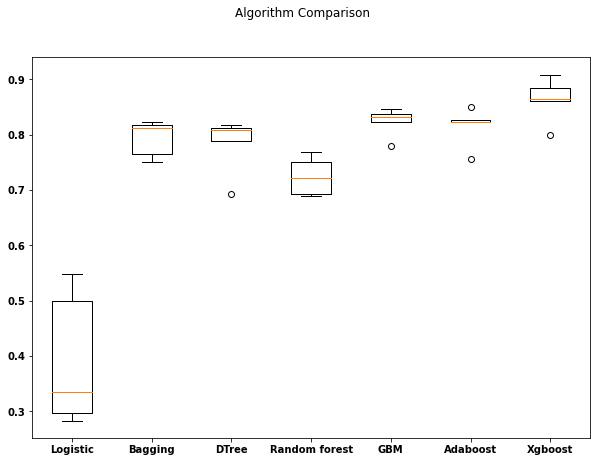

<IPython.core.display.Javascript object>

In [64]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure(figsize=(10, 7))

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

In [65]:
# To help with reading and manipulation of data
import numpy as np
from numpy import array
import pandas as pd

# To help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# To split the data
from sklearn.model_selection import train_test_split

# To impute missing values
from sklearn.impute import SimpleImputer

# To do one-hot encoding
from sklearn.preprocessing import OneHotEncoder

# To build a decision tree model
from sklearn.tree import DecisionTreeClassifier

# To get different performance metrics
import sklearn.metrics as metrics
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    recall_score,
    accuracy_score,
    precision_score,
    f1_score,
)


# To undersample and oversample the data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# To suppress warnings
import warnings

warnings.filterwarnings("ignore")

<IPython.core.display.Javascript object>

## Oversampling train data using SMOTE

In [66]:
# Fit SMOTE on train data(Synthetic Minority Oversampling Technique)
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

<IPython.core.display.Javascript object>

In [67]:
print("Before OverSampling, count of label '1': {}".format(sum(y_train == 1)))
print("Before OverSampling, count of label '0': {} \n".format(sum(y_train == 0)))

print("After OverSampling, count of label '1': {}".format(sum(y_train_over == 1)))
print("After OverSampling, count of label '0': {} \n".format(sum(y_train_over == 0)))

print("After OverSampling, the shape of train_X: {}".format(X_train_over.shape))
print("After OverSampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before OverSampling, count of label '1': 1041
Before OverSampling, count of label '0': 5439 

After OverSampling, count of label '1': 5439
After OverSampling, count of label '0': 5439 

After OverSampling, the shape of train_X: (10878, 56)
After OverSampling, the shape of train_y: (10878,) 



<IPython.core.display.Javascript object>

#### Let's train the model using the oversampled data

In [68]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Logistic", LogisticRegression(random_state=1)))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("DTree", DecisionTreeClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models


# loop through all models to get the mean cross validated score
print("\n" "Over Sampled Cross-Validation Performance:" "\n")

for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))

print("\n" "Over Sampled -Training Performance:" "\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_train_over, model.predict(X_train_over)) * 100
    print("{}: {}".format(name, scores))

print("\n" "Over Sampled - Separate Validation Performance:" "\n")
for name, model in models:
    pred_val = model.predict(X_val)
    scores2 = recall_score(y_val, pred_val) * 100
    print("{}: {}".format(name, scores2))


Over Sampled Cross-Validation Performance:

Logistic: 82.10984428269927
Bagging: 96.02858312138103
DTree: 95.31150224579254
Random forest: 96.76406326099898
GBM: 97.42604781102872
Adaboost: 96.48826032252828
Xgboost: 98.21652280967585

Over Sampled -Training Performance:

Logistic: 87.07482993197279
Bagging: 99.79775694061408
DTree: 100.0
Random forest: 100.0
GBM: 98.10626953484096
Adaboost: 97.03989703989704
Xgboost: 100.0

Over Sampled - Separate Validation Performance:

Logistic: 53.25670498084292
Bagging: 84.67432950191571
DTree: 80.84291187739464
Random forest: 79.3103448275862
GBM: 86.97318007662835
Adaboost: 85.44061302681992
Xgboost: 91.18773946360153


<IPython.core.display.Javascript object>

- Logistic Regression is performing relatively low (less than 54%) on a separate validation data (original validation set). 
- Bagging, Decision Tree, Random Forest, and XGBoost are overfitting. 
- GradientBoosting and Adaboost appears to be the least overfit and the model performance have great performance on training and validation data.
- GradientBoosting and Adaboost still appear to be the least overfit.
- Compared with the original dataset, GradientBoosting model performance has increased to (86.97%) due to oversampling, while AdaBoost appears the same (85.44%) regardless of oversampling.

## Undersampling train data using Random Undersampler


In [69]:
# fit random under sampler on the train data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

<IPython.core.display.Javascript object>

In [70]:
print("Before Under Sampling, count of label '1': {}".format(sum(y_train == 1)))
print("Before Under Sampling, count of label '0': {} \n".format(sum(y_train == 0)))

print("After Under Sampling, count of label '1': {}".format(sum(y_train_un == 1)))
print("After Under Sampling, count of label '0': {} \n".format(sum(y_train_un == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_un.shape))

Before Under Sampling, count of label '1': 1041
Before Under Sampling, count of label '0': 5439 

After Under Sampling, count of label '1': 1041
After Under Sampling, count of label '0': 1041 

After Under Sampling, the shape of train_X: (2082, 56)
After Under Sampling, the shape of train_y: (2082,) 



<IPython.core.display.Javascript object>

#### Let's train the model using the undersampled data

In [71]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Logistic", LogisticRegression(random_state=1)))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("DTree", DecisionTreeClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models


# loop through all models to get the mean cross validated score
print("\n" "Under Sampled Cross-Validation Performance:" "\n")

for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))

print("\n" "Under Sampled -Training Performance:" "\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_train_un, model.predict(X_train_un)) * 100
    print("{}: {}".format(name, scores))
print("\n" "Under Sampled - Separate Validation Performance:" "\n")
for name, model in models:
    pred_val = model.predict(X_val)
    scores3 = recall_score(y_val, pred_val) * 100
    print("{}: {}".format(name, scores3))


Under Sampled Cross-Validation Performance:

Logistic: 78.58391608391608
Bagging: 91.25828119249171
DTree: 88.85673536989327
Random forest: 92.98905042326095
GBM: 94.81229297018771
Adaboost: 92.79306220095694
Xgboost: 95.00414059624586

Under Sampled -Training Performance:

Logistic: 80.59558117195004
Bagging: 99.23150816522575
DTree: 100.0
Random forest: 100.0
GBM: 98.27089337175792
Adaboost: 95.48511047070124
Xgboost: 100.0

Under Sampled - Separate Validation Performance:

Logistic: 81.60919540229885
Bagging: 94.6360153256705
DTree: 90.80459770114942
Random forest: 93.86973180076629
GBM: 96.16858237547893
Adaboost: 95.78544061302682
Xgboost: 96.93486590038314


<IPython.core.display.Javascript object>

- Logistic Regression is performing relatively low (less than 82%). 
- Bagging, Decision Tree, Random Forest, and XGBoost are overfitting. 
- GradientBoosting and Adaboost appears to be the least overfit and the model performance have great performance on training and validation data.
- GradientBoosting and Adaboost still appear to be the least overfit.
- Compared with the original dataset, GradientBoosting model performance has increased (to at least 94.8%) due to undersampling, while AdaBoost model performance has increased (to at least 92.79%) due to undersampling.
- Undersampling increased the performance of each of the models.


#### Hyperparameter tuning will be performed on all the models (with undersampled data) except Logistic Regression model which has performed relatively low.

#  Hyperparameter Tuning 


In [72]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

<IPython.core.display.Javascript object>

In [73]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

<IPython.core.display.Javascript object>

Undersampled data gave better performance. So, those are the models that will be tuned to see if they might improve.

### Randomized Search

## AdaBoost

In [74]:
%%time 

# defining model
model_1 = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in GridSearchCV

param_grid = {
    "n_estimators": np.arange(10, 110, 10),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=model_1, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 90, 'learning_rate': 0.1, 'base_estimator': DecisionTreeClassifier(max_depth=2, random_state=1)} with CV score=0.9548675009201325:
Wall time: 27.6 s


<IPython.core.display.Javascript object>

In [75]:
# building model with best parameters
adb_tuned_1 = AdaBoostClassifier(
    n_estimators=90,
    learning_rate=0.1,
    random_state=1,
    base_estimator=DecisionTreeClassifier(max_depth=2, random_state=1),
)

# Fit the model on training data
adb_tuned_1.fit(X_train_un, y_train_un)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=2,
                                                         random_state=1),
                   learning_rate=0.1, n_estimators=90, random_state=1)

<IPython.core.display.Javascript object>

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


Training performance:
   Accuracy  Recall  Precision    F1
0     0.963   0.971      0.955 0.963
*************************************


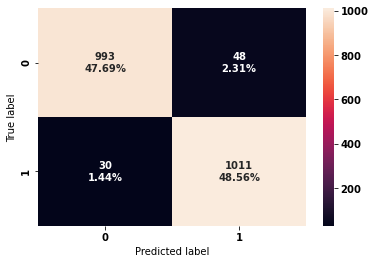

<IPython.core.display.Javascript object>

In [76]:
# Calculating different metrics on train set
Adaboost_random_train = model_performance_classification_sklearn(
    adb_tuned_1, X_train_un, y_train_un
)
print("Training performance:")
print(Adaboost_random_train)


print("*************************************")

# creating confusion matrix
confusion_matrix_sklearn(adb_tuned_1, X_train_un, y_train_un)

Validation performance:
   Accuracy  Recall  Precision    F1
0     0.936   0.962      0.728 0.828
*************************************


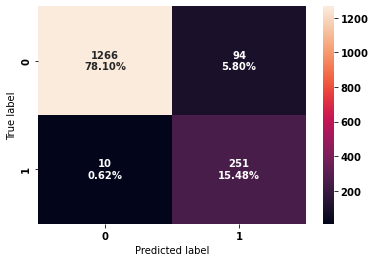

<IPython.core.display.Javascript object>

In [77]:
# Calculating different metrics on validation set
Adaboost_random_val = model_performance_classification_sklearn(
    adb_tuned_1, X_val, y_val
)
print("Validation performance:")
print(Adaboost_random_val)


print("*************************************")

# creating confusion matrix
confusion_matrix_sklearn(adb_tuned_1, X_val, y_val)

Recall is good and the precision is also good. 

## XGB Classifier

In [78]:
%%time

# defining model
model_2 = XGBClassifier(random_state=1,eval_metric='logloss')

# Parameter grid to pass in RandomizedSearchCV
param_grid={'n_estimators':np.arange(50,150,50),
            'scale_pos_weight':[2,5,10],
            'learning_rate':[0.01,0.1,0.2,0.05],
            'gamma':[0,1,3,5],
            'subsample':[0.8,0.9,1],
            'max_depth':np.arange(1,5,1),
            'reg_lambda':[5,10]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
xgb_tuned_2 = RandomizedSearchCV(estimator=model_2, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
xgb_tuned_2.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(xgb_tuned_2.best_params_,xgb_tuned_2.best_score_))

Best parameters are {'subsample': 1, 'scale_pos_weight': 10, 'reg_lambda': 10, 'n_estimators': 50, 'max_depth': 1, 'learning_rate': 0.1, 'gamma': 1} with CV score=1.0:
Wall time: 24 s


<IPython.core.display.Javascript object>

In [79]:
# building model with best parameters
xgb_tuned_2 = XGBClassifier(
    random_state=1,
    n_estimators=50,
    scale_pos_weight=10,
    gamma=1,
    subsample=1,
    learning_rate=0.1,
    eval_metric="logloss",
    max_depth=1,
    reg_lambda=10,
)
# Fit the model on training data
xgb_tuned_2.fit(X_train_un, y_train_un)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              eval_metric='logloss', gamma=1, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.1, max_delta_step=0,
              max_depth=1, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=50, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=1,
              reg_alpha=0, reg_lambda=10, scale_pos_weight=10, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

<IPython.core.display.Javascript object>

Training performance:
   Accuracy  Recall  Precision    F1
0     0.626   1.000      0.572 0.728
*************************************


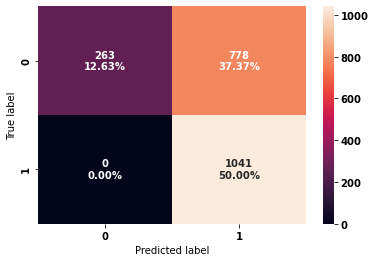

<IPython.core.display.Javascript object>

In [80]:
# Calculating different metrics on train set
XGB_random_train = model_performance_classification_sklearn(
    xgb_tuned_2, X_train_un, y_train_un
)
print("Training performance:")
print(XGB_random_train)


print("*************************************")

# creating confusion matrix
confusion_matrix_sklearn(xgb_tuned_2, X_train_un, y_train_un)

Validation performance:
   Accuracy  Recall  Precision    F1
0     0.333   1.000      0.194 0.326
*************************************


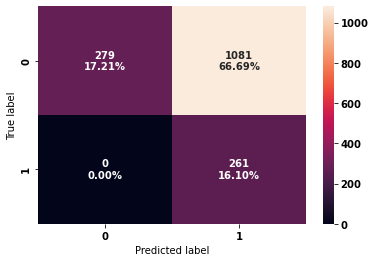

<IPython.core.display.Javascript object>

In [81]:
# Calculating different metrics on validation set
xgb_random_val = model_performance_classification_sklearn(xgb_tuned_2, X_val, y_val)
print("Validation performance:")
print(xgb_random_val)


print("*************************************")

# creating confusion matrix
confusion_matrix_sklearn(xgb_tuned_2, X_val, y_val)

Recall is high for both training and validation, however, the precision is too low. There will be many false positives.

## GradientBoosting

In [82]:
%%time 

# defining model
model_3 =GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in GridSearchCV

param_grid={'n_estimators':np.arange(50,150,50),
            'learning_rate':[0.01,0.1,0.2,0.5],
            'max_depth':[1,3,5,7],
            'subsample':[0.8,0.9,1],
            'max_depth':np.arange(1,5,1),}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=model_3, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 4, 'learning_rate': 0.2} with CV score=0.9577337136547662:
Wall time: 22.5 s


<IPython.core.display.Javascript object>

In [83]:
# building model with best parameters
gbc_tuned_3 = GradientBoostingClassifier(
    random_state=1, n_estimators=100, subsample=0.8, learning_rate=0.2, max_depth=4,
)
# Fit the model on training data
gbc_tuned_3.fit(X_train_un, y_train_un)

GradientBoostingClassifier(learning_rate=0.2, max_depth=4, random_state=1,
                           subsample=0.8)

<IPython.core.display.Javascript object>

Training performance:
   Accuracy  Recall  Precision    F1
0     1.000   1.000      1.000 1.000
*************************************


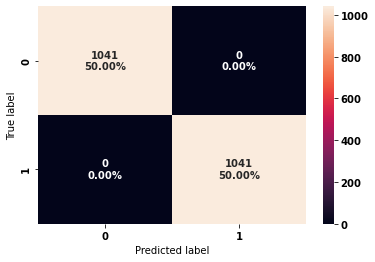

<IPython.core.display.Javascript object>

In [84]:
# Calculating different metrics on train set
gbc_random_train = model_performance_classification_sklearn(
    gbc_tuned_3, X_train_un, y_train_un
)
print("Training performance:")
print(gbc_random_train)


print("*************************************")

# creating confusion matrix
confusion_matrix_sklearn(gbc_tuned_3, X_train_un, y_train_un)

Validation performance:
   Accuracy  Recall  Precision    F1
0     0.943   0.966      0.750 0.844
*************************************


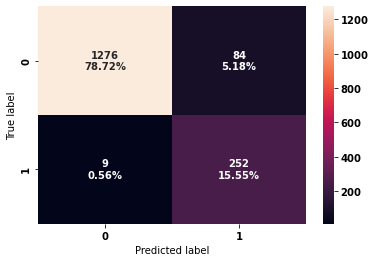

<IPython.core.display.Javascript object>

In [85]:
# Calculating different metrics on validation set
gbc_random_val = model_performance_classification_sklearn(gbc_tuned_3, X_val, y_val)
print("Validation performance:")
print(gbc_random_val)


print("*************************************")

# creating confusion matrix
confusion_matrix_sklearn(gbc_tuned_3, X_val, y_val)

Gradient Boosting Classifier performs better in all the metrics compared to Adaboost model

## Random Forest

In [86]:
# Choose the type of classifier.
model_4 = RandomForestClassifier(random_state=1, oob_score=True, bootstrap=True)

param_grid = {
    "max_depth": list(np.arange(1, 30, 5)) + [None],
    "max_features": ["sqrt", "log2", None],
    "min_samples_leaf": np.arange(1, 15, 5),
    "min_samples_split": np.arange(2, 20, 5),
    "n_estimators": np.arange(10, 150, 10),
}


# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(
    estimator=model_4,
    param_distributions=param_grid,
    n_jobs=-1,
    n_iter=50,
    scoring=scorer,
    cv=5,
    random_state=1,
)

# Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un, y_train_un)

print(
    "Best parameters are {} with CV score={}:".format(
        randomized_cv.best_params_, randomized_cv.best_score_
    )
)

Best parameters are {'n_estimators': 80, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 11} with CV score=0.945242914979757:


<IPython.core.display.Javascript object>

In [87]:
# building model with best parameters
rf_tuned_4 = RandomForestClassifier(
    random_state=1,
    n_estimators=80,
    min_samples_split=2,
    min_samples_leaf=1,
    max_features=None,
    max_depth=11,
)
# Fit the model on training data
rf_tuned_4.fit(X_train_un, y_train_un)

RandomForestClassifier(max_depth=11, max_features=None, n_estimators=80,
                       random_state=1)

<IPython.core.display.Javascript object>

Training performance:
   Accuracy  Recall  Precision    F1
0     0.999   1.000      0.998 0.999
*************************************


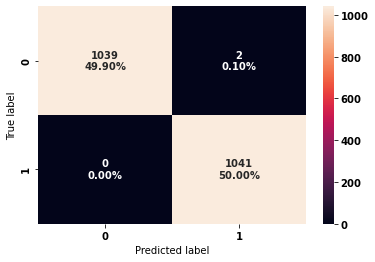

<IPython.core.display.Javascript object>

In [88]:
# Calculating different metrics on train set
rf_random_train = model_performance_classification_sklearn(
    rf_tuned_4, X_train_un, y_train_un
)
print("Training performance:")
print(rf_random_train)


print("*************************************")

# creating confusion matrix
confusion_matrix_sklearn(rf_tuned_4, X_train_un, y_train_un)

Validation performance:
   Accuracy  Recall  Precision    F1
0     0.920   0.946      0.682 0.793
*************************************


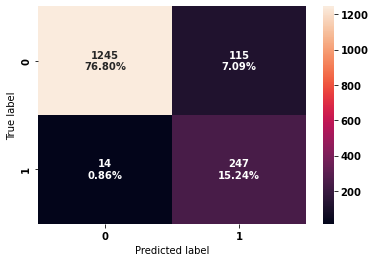

<IPython.core.display.Javascript object>

In [89]:
# Calculating different metrics on validation set
rf_random_val = model_performance_classification_sklearn(rf_tuned_4, X_val, y_val)
print("Validation performance:")
print(rf_random_val)


print("*************************************")

# creating confusion matrix
confusion_matrix_sklearn(rf_tuned_4, X_val, y_val)

High recall, but low precision for Randomforest

## Bagging

In [90]:
# Choose the type of classifier.
model_5 = BaggingClassifier(random_state=1)

# Grid of parameters to choose from
param_grid = {
    "max_samples": [0.7, 0.8, 0.9, 1],
    "max_features": [0.7, 0.8, 0.9, 1],
    "n_estimators": [10, 50, 100, 150],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(
    estimator=model_5,
    param_distributions=param_grid,
    n_jobs=-1,
    n_iter=100,
    scoring=scorer,
    cv=5,
    random_state=1,
)

# Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un, y_train_un)

print(
    "Best parameters are {} with CV score={}:".format(
        randomized_cv.best_params_, randomized_cv.best_score_
    )
)

Best parameters are {'n_estimators': 50, 'max_samples': 1, 'max_features': 0.7} with CV score=1.0:


<IPython.core.display.Javascript object>

In [91]:
# building model with best parameters
bc_tuned_5 = BaggingClassifier(
    random_state=1, n_estimators=50, max_samples=1, max_features=0.7,
)
# Fit the model on training data
bc_tuned_5.fit(X_train_un, y_train_un)

BaggingClassifier(max_features=0.7, max_samples=1, n_estimators=50,
                  random_state=1)

<IPython.core.display.Javascript object>

Training performance:
   Accuracy  Recall  Precision    F1
0     0.500   0.000      0.000 0.000
*************************************


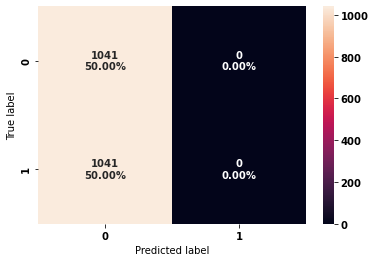

<IPython.core.display.Javascript object>

In [92]:
# Calculating different metrics on train set
bc_random_train = model_performance_classification_sklearn(
    bc_tuned_5, X_train_un, y_train_un
)
print("Training performance:")
print(bc_random_train)


print("*************************************")

# creating confusion matrix
confusion_matrix_sklearn(bc_tuned_5, X_train_un, y_train_un)

Validation performance:
   Accuracy  Recall  Precision    F1
0     0.839   0.000      0.000 0.000
*************************************


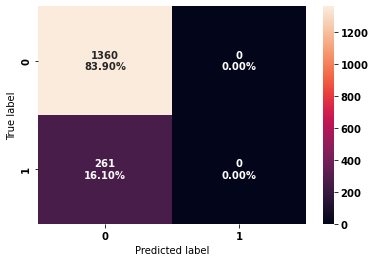

<IPython.core.display.Javascript object>

In [93]:
# Calculating different metrics on validation set
bc_random_val = model_performance_classification_sklearn(bc_tuned_5, X_val, y_val)
print("Validation performance:")
print(bc_random_val)


print("*************************************")

# creating confusion matrix
confusion_matrix_sklearn(bc_tuned_5, X_val, y_val)

Bagging Classifier failed on recall and precision.

## Decision Tree 

In [94]:
# Choose the type of classifier.
model_0 = DecisionTreeClassifier(random_state=1)

# Grid of parameters to choose from
param_grid = {
    "max_depth": np.arange(2, 30),
    "min_samples_leaf": [1, 2, 5, 7, 10],
    "max_leaf_nodes": [2, 3, 5, 10, 15],
    "min_impurity_decrease": [0.0001, 0.001, 0.01, 0.1],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(
    estimator=model_0,
    param_distributions=param_grid,
    n_jobs=-1,
    n_iter=100,
    scoring=scorer,
    cv=5,
    random_state=1,
)

# Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un, y_train_un)

print(
    "Best parameters are {} with CV score={}:".format(
        randomized_cv.best_params_, randomized_cv.best_score_
    )
)

Best parameters are {'min_samples_leaf': 2, 'min_impurity_decrease': 0.0001, 'max_leaf_nodes': 15, 'max_depth': 6} with CV score=0.919308980493191:


<IPython.core.display.Javascript object>

In [95]:
# building model with best parameters
dt_tuned_0 = DecisionTreeClassifier(
    random_state=1,
    min_samples_leaf=2,
    min_impurity_decrease=0.0001,
    max_leaf_nodes=15,
    max_depth=6,
)
# Fit the model on training data
dt_tuned_0.fit(X_train_un, y_train_un)

DecisionTreeClassifier(max_depth=6, max_leaf_nodes=15,
                       min_impurity_decrease=0.0001, min_samples_leaf=2,
                       random_state=1)

<IPython.core.display.Javascript object>

Training performance:
   Accuracy  Recall  Precision    F1
0     0.930   0.937      0.925 0.931
*************************************


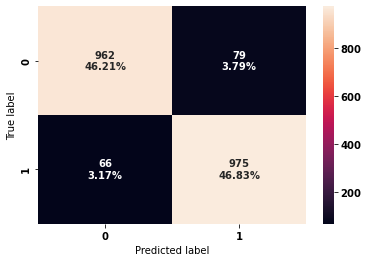

<IPython.core.display.Javascript object>

In [96]:
# Calculating different metrics on train set
dt_random_train = model_performance_classification_sklearn(
    dt_tuned_0, X_train_un, y_train_un
)
print("Training performance:")
print(dt_random_train)


print("*************************************")

# creating confusion matrix
confusion_matrix_sklearn(dt_tuned_0, X_train_un, y_train_un)

Validation performance:
   Accuracy  Recall  Precision    F1
0     0.890   0.920      0.603 0.728
*************************************


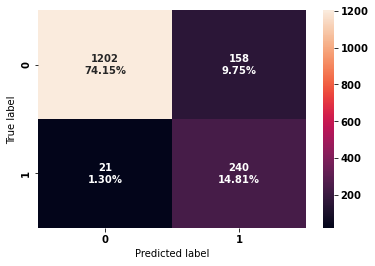

<IPython.core.display.Javascript object>

In [97]:
# Calculating different metrics on validation set
dt_random_val = model_performance_classification_sklearn(dt_tuned_0, X_val, y_val)
print("Validation performance:")
print(dt_random_val)


print("*************************************")

# creating confusion matrix
confusion_matrix_sklearn(dt_tuned_0, X_val, y_val)

The recall score is good, but precision is low for the Decision Tree Model

#### Comparing all models

In [98]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        dt_random_train.T,
        rf_random_train.T,
        bc_random_train.T,
        Adaboost_random_train.T,
        gbc_random_train.T,
        XGB_random_train.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Decision Tree Tuned Undersampled",
    "Random Forest Tuned Undersampled",
    "Bagging Classifier Tuned Undersampled",
    "AdaBoost Classifier Tuned Undersampled",
    "Gradient Boosting Classifier Tuned Undersampled",
    "XGBoost Classifier uned Undersampled",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Decision Tree Tuned Undersampled,Random Forest Tuned Undersampled,Bagging Classifier Tuned Undersampled,AdaBoost Classifier Tuned Undersampled,Gradient Boosting Classifier Tuned Undersampled,XGBoost Classifier uned Undersampled
Accuracy,0.930,0.999,0.500,0.963,1.000,0.626
Recall,0.937,1.000,0.000,0.971,1.000,1.000
Precision,0.925,0.998,0.000,0.955,1.000,0.572
F1,0.931,0.999,0.000,0.963,1.000,0.728


<IPython.core.display.Javascript object>

The tuned models perform well on the training set except Bagging Classifier

In [99]:
# Validation performance comparison

models_train_comp_df = pd.concat(
    [
        dt_random_val.T,
        rf_random_val.T,
        bc_random_val.T,
        Adaboost_random_val.T,
        gbc_random_val.T,
        xgb_random_val.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Decision Tree Tuned Undersampled",
    "Random Forest Tuned Undersampled",
    "Bagging Classifier Tuned Undersampled",
    "AdaBoost Classifier Tuned Undersampled",
    "Gradient Boosting Classifier Tuned Undersampled",
    "XGBoost Classifier Tuned Undersampled",
]
print("Validation performance comparison:")
models_train_comp_df

Validation performance comparison:


,Decision Tree Tuned Undersampled,Random Forest Tuned Undersampled,Bagging Classifier Tuned Undersampled,AdaBoost Classifier Tuned Undersampled,Gradient Boosting Classifier Tuned Undersampled,XGBoost Classifier Tuned Undersampled
Accuracy,0.890,0.920,0.839,0.936,0.943,0.333
Recall,0.920,0.946,0.000,0.962,0.966,1.000
Precision,0.603,0.682,0.000,0.728,0.750,0.194
F1,0.728,0.793,0.000,0.828,0.844,0.326


<IPython.core.display.Javascript object>

The tuned models perform well on the validation set except Bagging Classifier.
Tuned Gradient Boosting Classifier on undersampled dataset performed better on Accuracy, Recall, Precision and F1 scores; followed by Adaboost Classifier.

#### Tuned Gradient Boosting Classifier on undersampled dataset performed better on Accuracy, Recall, Precision and F1 scores.

In [100]:
# Calculating different metrics on Test set
dt_random_test = model_performance_classification_sklearn(dt_tuned_0, X_test, y_test)
rf_random_test = model_performance_classification_sklearn(rf_tuned_4, X_test, y_test)
bc_random_test = model_performance_classification_sklearn(bc_tuned_5, X_test, y_test)
Adaboost_random_test = model_performance_classification_sklearn(
    adb_tuned_1, X_test, y_test
)
gbc_random_test = model_performance_classification_sklearn(gbc_tuned_3, X_test, y_test)
xgb_random_test = model_performance_classification_sklearn(xgb_tuned_2, X_test, y_test)

# Test performance comparison

models_train_comp_df = pd.concat(
    [
        dt_random_test.T,
        rf_random_test.T,
        bc_random_test.T,
        Adaboost_random_test.T,
        gbc_random_test.T,
        xgb_random_test.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Decision Tree Tuned Undersampled",
    "Random Forest Tuned Undersampled",
    "Bagging Classifier Tuned Undersampled",
    "AdaBoost Classifier Tuned Undersampled",
    "Gradient Boosting Classifier Tuned Undersampled",
    "XGBoost Classifier Tuned Undersampled",
]
print("Test performance comparison:")
models_train_comp_df

Test performance comparison:


,Decision Tree Tuned Undersampled,Random Forest Tuned Undersampled,Bagging Classifier Tuned Undersampled,AdaBoost Classifier Tuned Undersampled,Gradient Boosting Classifier Tuned Undersampled,XGBoost Classifier Tuned Undersampled
Accuracy,0.881,0.914,0.840,0.933,0.943,0.345
Recall,0.935,0.948,0.000,0.975,0.972,1.000
Precision,0.580,0.661,0.000,0.712,0.747,0.197
F1,0.716,0.779,0.000,0.823,0.845,0.329


<IPython.core.display.Javascript object>

- The tuned models perform well on the test set except Bagging Classifier.
- Tuned Gradient Boosting Classifier on undersampled dataset performed better on Accuracy, Precision and F1 scores; followed by Adaboost Classifier. However, Adaboost has a higher recall score.
- Based on the validation data, Gradient Boosting Classifier performed better. Thus, the best model will be Gradient Boosting Classifier.

#### Gradient Boosting Classifier performed better in Accuracy, Precision and F1 scores on the test data. So we are quite guaranteed of low false negatives (Recall Score over 97%), balanced prediction (F1 Score over 84%), and overall accuracy (Accuracy Score over 94%).

### We used undersampled data to make sure the data observations are subset of the original data set and equal distribution of Attrition Flag (50:50). Hence all the metrics would count including accuracy, since we now have a balanced dataset.


### Using Gradient Boosting model we are sure of high accuracy, recall, precision and F1 scores. Thus, the best model.

## Let's look at the feature importance on Gradient Boosting model developed

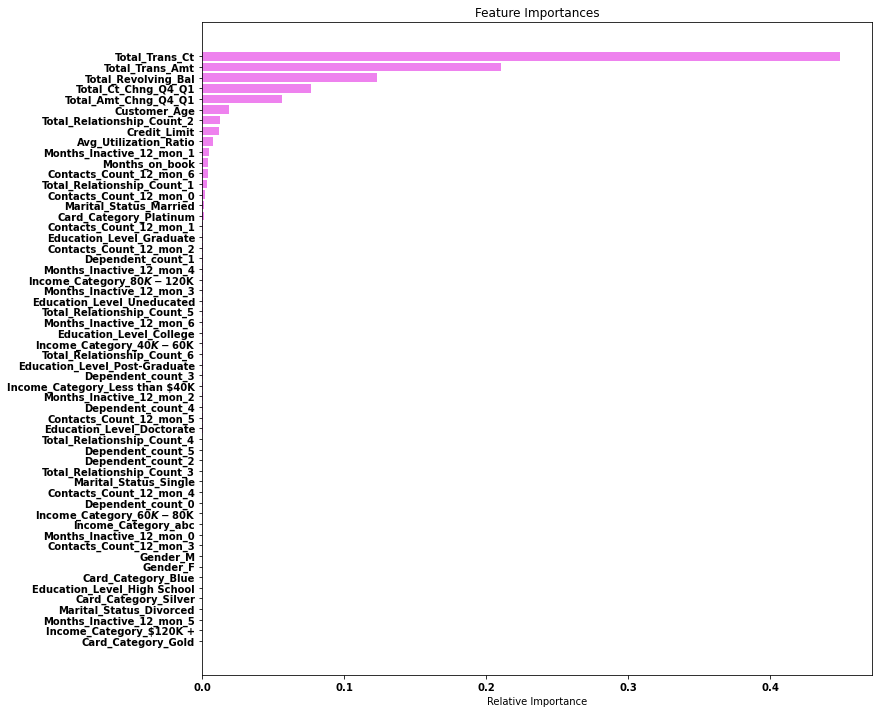

<IPython.core.display.Javascript object>

In [101]:
feature_names = X.columns
importances = gbc_tuned_3.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

#### The most important features are Total_Trans_Ct, Total_Trans_Amt, Total_Revolving_Bal, Total_Ct_Chng_Q4_Q1, Total_Amt_Chng_Q4_Q1, and Customer_Age

#  Pipelines for productionizing the model 

- Pipeline is a means of automating the machine learning workflow by enabling data to be transformed and correlated into a model that can then be analyzed to achieve outputs. This type of ML pipeline makes the process of inputting data into the ML model fully automated. 

- Now, we have a final model. let's use pipelines to put the model into production

In [102]:
from sklearn import preprocessing

<IPython.core.display.Javascript object>

In [103]:
# creating a list of numerical variables
numerical_features = [
    "Customer_Age",
    "Months_on_book",
    "Credit_Limit",
    "Total_Revolving_Bal",
    "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt",
    "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio",
]

# creating a transformer for numerical variables, which will apply simple imputer on the numerical variables
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median"))])


# creating a list of categorical variables
categorical_features = [
    "Gender",
    "Dependent_count",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
]


# creating a transformer for categorical variables, which will first apply simple imputer and 
#then do one hot encoding for categorical variables
categorical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("onehot", OneHotEncoder(handle_unknown="ignore")),
    ]
)




# handle_unknown = "ignore", allows model to handle any unknown category in the test data

# combining categorical transformer and numerical transformer using a column transformer

preprocessor = ColumnTransformer(
    transformers=[
        
        ("num", numeric_transformer, numerical_features),
        ("cat", categorical_transformer, categorical_features),
    ],
    remainder="passthrough",
)
# remainder = "passthrough" has been used, it will allow variables that are present in original data 
# but not in "numerical_columns" and "categorical_columns" to pass through the column transformer without any changes


<IPython.core.display.Javascript object>

In [104]:
data_main_2 = data.copy()


<IPython.core.display.Javascript object>

In [105]:
data_main_2["Attrition_Flag"].replace(
    {"Existing Customer": 0, "Attrited Customer": 1}, inplace=True
)

<IPython.core.display.Javascript object>

In [106]:
# Separating target variable and other variables
# Drop Avg_Open_To_Buy since it correlates perfectly with Credit Limit to avoid data leakage
X = data_main_2.drop(columns=["Attrition_Flag","Avg_Open_To_Buy"]) 
Y = data_main_2["Attrition_Flag"]


<IPython.core.display.Javascript object>

In [107]:
data_main_2.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,0,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,0,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,0,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,0,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


<IPython.core.display.Javascript object>

In [108]:
data_main_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Attrition_Flag            10127 non-null  int64   
 1   Customer_Age              10127 non-null  int64   
 2   Gender                    10127 non-null  category
 3   Dependent_count           10127 non-null  category
 4   Education_Level           8608 non-null   category
 5   Marital_Status            9378 non-null   category
 6   Income_Category           10127 non-null  category
 7   Card_Category             10127 non-null  category
 8   Months_on_book            10127 non-null  int64   
 9   Total_Relationship_Count  10127 non-null  category
 10  Months_Inactive_12_mon    10127 non-null  category
 11  Contacts_Count_12_mon     10127 non-null  category
 12  Credit_Limit              10127 non-null  float64 
 13  Total_Revolving_Bal       10127 non-null  int6

<IPython.core.display.Javascript object>

In [109]:
# Splitting data into training, validation and test set:
# first we split data into 2 parts, say temporary and test

X_temp_4, X_test_4, y_temp_4, y_test_4 = train_test_split(
    X, Y, test_size=0.2, random_state=1, stratify=Y
)

print(X_temp_4.shape, X_test_4.shape)
X_train_4, X_val_4, y_train_4, y_val_4 = train_test_split(
    X_temp_4, y_temp_4, test_size=0.2, random_state=1, stratify=y_temp_4
)

print(X_train_4.shape, X_val_4.shape)

(8101, 18) (2026, 18)
(6480, 18) (1621, 18)


<IPython.core.display.Javascript object>

In [110]:
# fit random under sampler on the train data
rus_4 = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un_4, y_train_un_4 = rus_4.fit_resample(X_train_4, y_train_4)

<IPython.core.display.Javascript object>

In [111]:
def myProcessingSteps(df):
    # Replacing the values in Education column
    df["Education_Level"].replace({"NaN": "Graduate"}, inplace=True)
    df["Education_Level"].replace({"": "Graduate"}, inplace=True)
    # Replacing the values in Marital status column
    df["Marital_Status"].replace(
        {"NaN": "Married"}, inplace=True,
    )
    df["Marital_Status"].replace(
        {"": "Married"}, inplace=True,
    )

    return df

<IPython.core.display.Javascript object>

In [112]:
# The function created for processing the data should be passed as an arugument in the FunctionTransformer
processing = FunctionTransformer(myProcessingSteps)

<IPython.core.display.Javascript object>

In [113]:
pipe_4 = Pipeline(
    steps=[
        ("data_processing", processing),
        ("preprocessor", preprocessor),
        (
            "GBC",
            GradientBoostingClassifier(
                random_state=1,
                n_estimators=100,
                subsample=0.8,
                learning_rate=0.2,
                max_depth=4,
            ),
        ),
    ]
)
# Fit the model on training data
# pipe.fit(X_train_un, y_train_un)
pipe_4.fit(X_train_un_4, y_train_un_4)

Pipeline(steps=[('data_processing',
                 FunctionTransformer(func=<function myProcessingSteps at 0x000001E38219D430>)),
                ('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['Customer_Age',
                                                   'Months_on_book',
                                                   'Credit_Limit',
                                                   'Total_Revolving_Bal',
                                                   'Total_Amt_Chng_Q4_Q1',
                                                   'Tota...
                                                                   SimpleImputer(strategy='most_frequent')),
               

<IPython.core.display.Javascript object>

In [114]:
train_score = pipe_4.score(X_train_un_4, y_train_un_4)
print(train_score)


1.0


<IPython.core.display.Javascript object>

In [115]:
val_score = pipe_4.score(X_val_4, y_val_4)
print(val_score)

0.9407772979642196


<IPython.core.display.Javascript object>

In [116]:
test_score = pipe_4.score(X_test_4, y_test_4)
print(test_score)

0.941263573543929


<IPython.core.display.Javascript object>

The model performance of over 94% accuracy score from pipeline conforms with the accuracy before adopting pipeline. Hence the results are correct.

In [117]:
val_pred = pipe_4.predict(X_val_4)
print(val_pred)

[0 0 0 ... 0 0 0]


<IPython.core.display.Javascript object>

In [118]:
test_pred = pipe_4.predict(X_test_4)
print(test_pred)

[0 1 0 ... 0 0 0]


<IPython.core.display.Javascript object>

In [119]:
y_test_4_d = pd.DataFrame(y_test_4)  # Convert to dataframe
test_pred_d = pd.DataFrame(test_pred)

<IPython.core.display.Javascript object>

In [120]:
y_test_4_d.reset_index(drop=True, inplace=True)  # reset index
test_pred_d.reset_index(drop=True, inplace=True)

<IPython.core.display.Javascript object>

In [121]:
test_pred_d.columns = [
    "Predicted Attrition Flag"
]  # Assign a column name to Predicted Test Data

<IPython.core.display.Javascript object>

In [122]:
pd.set_option("display.max_rows", None)  # To display all the rows

<IPython.core.display.Javascript object>

In [123]:
pd.concat(
    [test_pred_d, y_test_4_d], axis=1
)  # Comparing Predicted Attrition_Flag and Actual Attrition_Flag

,Predicted Attrition Flag,Attrition_Flag
0,0,0
1,1,1
2,0,0
3,1,0
4,1,1
5,0,0
6,1,1
7,0,0
8,0,0
9,0,0


<IPython.core.display.Javascript object>

In [124]:
X_test_4.shape

(2026, 18)

<IPython.core.display.Javascript object>

In [125]:
y_test_4_da = pd.DataFrame(y_test_4)  # Convert to dataframe
test_pred_da = pd.DataFrame(test_pred)
X_test_4_da = pd.DataFrame(X_test_4)

<IPython.core.display.Javascript object>

In [126]:
X_test_4_da.reset_index(drop=True, inplace=True)  # reset index
y_test_4_d.reset_index(drop=True, inplace=True)
test_pred_d.reset_index(drop=True, inplace=True)

<IPython.core.display.Javascript object>

In [127]:
pd.concat(
    [X_test_4_da, y_test_4_d, test_pred_d], axis=1
)  # Concatenate original X, Y and Predicted Y on the test set

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag,Predicted Attrition Flag
0,32,M,1,High School,Single,$80K - $120K,Blue,26,2,3,2,6407.000,1130,0.756,14471,93,0.603,0.176,0,0
1,50,M,1,Post-Graduate,Single,$60K - $80K,Blue,36,4,3,2,2317.000,0,0.734,2214,41,0.519,0.000,1,1
2,54,F,2,High School,Married,$40K - $60K,Blue,36,3,3,3,3892.000,0,0.738,4318,74,0.762,0.000,0,0
3,61,M,0,Uneducated,Married,$120K +,Blue,36,4,3,4,24172.000,2517,0.424,1658,27,0.500,0.104,0,1
4,41,F,3,College,Married,$40K - $60K,Blue,15,5,3,4,4312.000,2517,0.741,2693,56,0.436,0.584,1,1
5,41,F,2,Uneducated,Married,Less than $40K,Blue,33,3,3,3,3893.000,1157,1.169,1536,39,0.773,0.297,0,0
6,49,M,1,Uneducated,Single,$120K +,Blue,30,5,3,3,5181.000,0,0.830,8943,68,1.000,0.000,1,1
7,56,F,1,High School,Married,abc,Blue,49,1,2,1,17542.000,2517,0.800,13939,138,0.792,0.143,0,0
8,58,F,2,Uneducated,Divorced,Less than $40K,Silver,46,6,1,4,11684.000,653,0.622,4900,61,0.743,0.056,0,0
9,52,M,1,Post-Graduate,NaN,$80K - $120K,Blue,40,2,1,2,5520.000,2448,0.862,14330,116,0.681,0.443,0,0


<IPython.core.display.Javascript object>

In [128]:
# defining a function to check performance of a classification model built using sklearn
def model_performance_classification_piped(pred, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

<IPython.core.display.Javascript object>

In [129]:
def confusion_matrix_piped(real_target, pred_target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    cm = confusion_matrix(real_target, pred_target)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

<IPython.core.display.Javascript object>

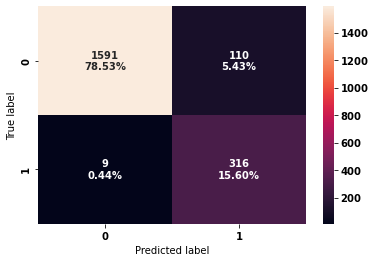

<IPython.core.display.Javascript object>

In [130]:
confusion_matrix_piped(y_test_4_da, test_pred_da)

- There are 9 (less than 0.5%) false negatives and 110 (less than 5.5%) false positives based on the test set prediction by the tuned undersampled trained Gradient Boosting model. Overall, less than 6% false predictions.
- So, the bank can confidently reduce false negatives and to some extent limit false positives.

In [131]:
model_performance_classification_piped(test_pred_da, y_test_4_da)

,Accuracy,Recall,Precision,F1
0,0.941,0.972,0.742,0.842


<IPython.core.display.Javascript object>

In [132]:
model_performance_classification_piped(test_pred, y_test_4)

,Accuracy,Recall,Precision,F1
0,0.941,0.972,0.742,0.842


<IPython.core.display.Javascript object>

In [133]:
model_performance_classification_piped(val_pred, y_val_4)

,Accuracy,Recall,Precision,F1
0,0.941,0.973,0.741,0.841


<IPython.core.display.Javascript object>

In [134]:
train_pred = pipe_4.predict(X_train_4)
print(train_pred)

[0 1 1 ... 0 1 0]


<IPython.core.display.Javascript object>

In [135]:
model_performance_classification_piped(train_pred, y_train_4)

,Accuracy,Recall,Precision,F1
0,0.950,1.000,0.764,0.866


<IPython.core.display.Javascript object>

The model performance is great with accuracy score over 94.1%, recall score over 97.2%, Precision score over 74.1%, and F1 score over 84.1%.

# Conclusion

- There is a strong positive correlation (0.79) between Customer_Age and Months_on_book.
- There is a perfect positive correlation (1.0) between Credit_Limit and Avg_Open_To_Buy. So, One Avg_Open_To_Buy was dropped and Credit_Limit retained while developing the model to avoid data leakage.
- There is a strong positive correlation (0.81) between Tota_Trans_Ct and Total_Trans_Amt. The more transactions, the more amount spent.More female attrited compared to male.

- There is a strong positive correlation (0.62) between Total_Revolving_Bal and Avg_Utilization_Ratio.
- There is a negative correlation (-0.54) between Avg_Utilization_Ratio and Avg_Open_To_Buy. An increase in one of the variables results in a decrease in the other.

- Customer age did not outrightly tell whether a customer remained or attrited. but apparently impacted the developed model.
- Average Months_on_book did not outrightly tell whether a customer remained or attrited. However, customers who remained are within wider range from 16 months.
    - Customers with higher credit limit remained with the bank, while customers with lower credit limit attritted.
- Customers with higher Avg_Open_To_Buy based on the third-quartile remained with the bank. But, on the average, Avg_Open_To_Buy did not impact customer attrition.
    - Customers with higher Total_Revolving_Bal remained with the bank, while customers with lower Total_Revolving_Bal attritted.
    - On the average, customers with higher Total_Amt_Chng_Q4_Q1 remained with the bank, while customers with lower Total_Amt_Chng_Q4_Q1 attritted.
    - Customers with higher Total_Trans_Amt remained with the bank, while customers with lower Total_Trans_Amt attritted.
    - Customers with higher Total_Trans_Ct remained with the bank, while customers with lower Total_Trans_Ct attritted.
    - Customers with higher Total_Ct_Chng_Q4_Q1 remained with the bank, while customers with lower Total_Ct_Chng_Q4_Q1 attritted.
    - Customers with higher Avg_Utilization_Ratio remained with the bank, while customers with lower Avg_Utilization_Ratio attritted.

- More female attrited compared to male.
- The most attrited customers are those with 3 dependants and the least had 1 dependant.
- The most attrited customers have doctorate degree, while the least attrited have college or high school qualifications.
    - The most attrited customers are single, while the least attrited are married.
    - The most attrited customers earn annual incomes over 120K dollars, followed by those than earn less than 40K dollars; while the least attrited earn between 60K-80K dollars annually. The bank appears inefficient for low and very high income earners.
    - The most attrited customers are in Platinum card category, followed by Gold card category; while the least attrited are in the Silver card category.
- The most attrited customers have 2 total relationship count, followed by 1; while the least attrited have 6 relationship count. So, customers who have held 6 products with the bank remain with the bank.
- The most attrited customers have never been inactive (0 month) within the last 12 months, however they are negligible in the dataset compared to other customers. More reasonably, the more attrited customers have been inactive for 3 to 4 months; while the least attrited have been inactive for 1 month within the last 12 months. It tends to suggest that the more active and in close contact with the bank, the higher chance of remaining with the bank.
- The most attrited customers had contact with the bank 6 times within the last 12 months, followed by 5 in that order up to 0. It appears that the more contact customers have with the bank the more they are attrited.

    - So, there tend to be a contrast between months of contact with the bank and months of activity with the bank.

- Gradient Boosting Classifier gave accuracy 0.941, recall 0.972, precision 0.742, F1 score 0.842. Our priority is to have a balanced prediction, so Gradient Boosting offers F1 score of 0.842 which is good enough, followed by a recall score of o.972 (even thouMore female attrited compared to male.

    
- The most important features are Total_Trans_Ct, Total_Trans_Amt, Total_Revolving_Bal, Total_Ct_Chng_Q4_Q1, Total_Amt_Chng_Q4_Q1, and Customer_Age.


# Business Recommendation

- Customers with higher credit limit remained with the bank, while customers with lower credit limit attritted. So, the bank should target more customers with high credit limit. The bank should create a more inclusive environment for customers with lower credit limit to encourage them to remain with the bank.

 - Customers with higher Total_Revolving_Bal remained with the bank, while customers with lower Total_Revolving_Bal attritted. So, customers with higher Total_Revolving_Bal tend to have more money with the bank and they remained with the bank. Hence, customers should be encouraged to save with the bank at a good interest rate to keep them with the bank.
 
- Customers with higher Total_Amt_Chng_Q4_Q1, Total_Trans_Amt, Total_Trans_Ct, Total_Ct_Chng_Q4_Q1 remained with the bank. It appears the more transaction and transaction amount, the more customers remain with the bank. The bank should create more products to welcome different category of customers to patronise them. That way, those customers will be retained with the bank.

- Customers with higher Avg_Utilization_Ratio remained with the bank, while customers with lower Avg_Utilization_Ratio attritted. The more available credit the customer spent, the more chance of remaining. So, customers should be encouraged to spend from their available credit, as it tends to give them a sense of commitment with the bank and therby retained.
 
- The most attrited customers are single, while the least attrited are married. Married customers probably have higher joint income. So, they tend to remain with the bank. So, married customers should be target more to keep with the bank.

- The most attrited customers earn annual incomes over 120K dollars, followed by those than earn less than 40K dollars; while the least attrited earn between 60K-80K dollars annually. The bank appears inefficient for low and very high income earners. Similaryly, the most attrited customers are in Platinum card category, followed by Gold and blue card category; while the least attrited are in the Silver card category. The silver card category tend to represent the average income earners (less 120K+ dollars earners). So, the bank should develop more products to welcome different category of income earners to remain with the bank. 

- There tend to be a contrast between months of contact with the bank and months of activity with the bank. They remain with the bank with more activity, and remain with the bank with less months of contact. It appears the less the customers come into the bank, the more they feel the need to remain. Probably, the customer service within the bank is poor and needs to be looked into to ensure customers' activity is in tune with the months of contact with the bank.
    

# Thank You!

# Let's experience how pipeline ignores unnecessary columns

In [136]:
data_fin = bc.copy()

<IPython.core.display.Javascript object>

In [137]:
pipe_4.predict(bc)

array([0, 0, 0, ..., 1, 1, 1], dtype=int64)

<IPython.core.display.Javascript object>

In [138]:
xs = pipe_4.predict(X)
print(xs)

[0 0 0 ... 1 1 1]


<IPython.core.display.Javascript object>

In [139]:
# bc originally contains X and Y variables. So, ignore will skip all variables that were not trained in the pipeline. Here, Y.
# OneHotEncoder(handle_unknown="ignore")

bcs = pipe_4.predict(bc)
print(bcs)

[0 0 0 ... 1 1 1]


<IPython.core.display.Javascript object>

In [140]:
model_performance_classification_piped(xs, Y)

,Accuracy,Recall,Precision,F1
0,0.947,0.990,0.756,0.857


<IPython.core.display.Javascript object>

In [141]:
model_performance_classification_piped(bcs, Y)

,Accuracy,Recall,Precision,F1
0,0.947,0.990,0.756,0.857


<IPython.core.display.Javascript object>

In [142]:

Y_df = pd.DataFrame(Y)  # Convert to dataframe
test_pred_df = pd.DataFrame(bcs)
X_df = pd.DataFrame(X)

Y_df.reset_index(drop=True, inplace=True)  # reset index
test_pred_df.reset_index(drop=True, inplace=True)
X_df.reset_index(drop=True, inplace=True)

test_pred_df.columns = [
    "Predicted Attrition Flag"
]  # Assign a column name to Predicted Test Data



<IPython.core.display.Javascript object>

In [143]:
pd.concat(
    [X_df, Y_df, test_pred_df], axis=1
)  # Concatenate original X, Y and Predicted Y on the test set

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag,Predicted Attrition Flag
0,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,1.335,1144,42,1.625,0.061,0,0
1,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,1.541,1291,33,3.714,0.105,0,0
2,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,2.594,1887,20,2.333,0.000,0,0
3,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,1.405,1171,20,2.333,0.760,0,0
4,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,2.175,816,28,2.500,0.000,0,0
5,44,M,2,Graduate,Married,$40K - $60K,Blue,36,3,1,2,4010.000,1247,1.376,1088,24,0.846,0.311,0,0
6,51,M,4,NaN,Married,$120K +,Gold,46,6,1,3,34516.000,2264,1.975,1330,31,0.722,0.066,0,0
7,32,M,0,High School,NaN,$60K - $80K,Silver,27,2,2,2,29081.000,1396,2.204,1538,36,0.714,0.048,0,0
8,37,M,3,Uneducated,Single,$60K - $80K,Blue,36,5,2,0,22352.000,2517,3.355,1350,24,1.182,0.113,0,0
9,48,M,2,Graduate,Single,$80K - $120K,Blue,36,6,3,3,11656.000,1677,1.524,1441,32,0.882,0.144,0,0


<IPython.core.display.Javascript object>

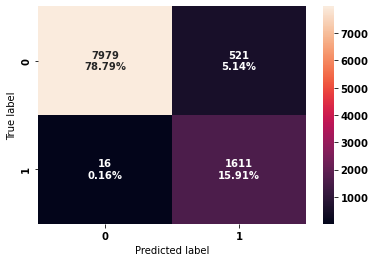

<IPython.core.display.Javascript object>

In [144]:
confusion_matrix_piped(Y_df, test_pred_df)

In [145]:
model_performance_classification_piped(test_pred_df, Y_df)

,Accuracy,Recall,Precision,F1
0,0.947,0.990,0.756,0.857


<IPython.core.display.Javascript object>